# Proyek Analisis Data: Air Quality Dataset
- **Nama:** 
- **Email:** 
- **ID Dicoding:** 

## Menentukan Pertanyaan Bisnis

- Bagaimana pengaruh kecepatan angin (WSPM) terhadap penyebaran konsentrasi PM2.5 selama musim panas (Juni hingga Agustus) di masing-masing stasiun pengukuran?
- Bagaimana konsentrasi NO2 dan CO mempengaruhi kualitas udara secara keseluruhan di stasiun-stasiun urban selama tiga tahun terakhir?
- Bagaimana pengaruh suhu (TEMP) dan kelembaban udara (DEWP) terhadap konsentrasi PM10 dan SO2 di berbagai stasiun pengukuran selama lima tahun terakhir?

## Import Semua Packages/Library yang Digunakan

In [ ]:
%pip install -r requirements.txt

## Data Wrangling

### Gathering Data
Pada tahap ini, kita akan mengumpulkan data yang akan digunakan untuk analisis data. Data yang digunakan adalah data polusi udara di China. Data ini dapat diunduh dari [Google Drive](https://drive.usercontent.google.com/download?id=1RhU3gJlkteaAQfyn9XOVAz7a5o1-etgr).
Kode di bawah ini akan menggabungkan data dari beberapa file CSV yang telah diunduh menjadi satu DataFrame.

In [2]:
import pandas as pd
from pathlib import Path
from tqdm import tqdm

data_dir = Path('data/')

if not data_dir.exists():
    raise FileNotFoundError(f"Direktori {data_dir} tidak ditemukan. Pastikan path benar.")

csv_files = list(data_dir.glob('*.csv'))

if not csv_files:
    raise FileNotFoundError(f"Tidak ada file CSV ditemukan di direktori {data_dir}.")

print(f"Ditemukan {len(csv_files)} file CSV di direktori {data_dir}.")
df_list = []

for file in tqdm(csv_files, desc="Membaca file CSV"):
    try:
        df = pd.read_csv(file)
        df['DateTime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])
        df_list.append(df)
        print(f"Berhasil membaca {file.name} dengan {df.shape[0]} baris.")
    except Exception as e:
        print(f"Gagal membaca {file.name}: {e}")

if df_list:
    combined_df = pd.concat(df_list, ignore_index=True)
    print(f"Data gabungan memiliki {combined_df.shape[0]} baris dan {combined_df.shape[1]} kolom.")
else:
    raise ValueError("Tidak ada data yang berhasil dibaca.")

combined_df.head()


Ditemukan 12 file CSV di direktori data.


Membaca file CSV:  17%|█▋        | 2/12 [00:00<00:02,  4.79it/s]

Berhasil membaca PRSA_Data_Aotizhongxin_20130301-20170228.csv dengan 35064 baris.
Berhasil membaca PRSA_Data_Changping_20130301-20170228.csv dengan 35064 baris.


Membaca file CSV:  33%|███▎      | 4/12 [00:00<00:01,  5.42it/s]

Berhasil membaca PRSA_Data_Dingling_20130301-20170228.csv dengan 35064 baris.
Berhasil membaca PRSA_Data_Dongsi_20130301-20170228.csv dengan 35064 baris.


Membaca file CSV:  50%|█████     | 6/12 [00:01<00:01,  5.89it/s]

Berhasil membaca PRSA_Data_Guanyuan_20130301-20170228.csv dengan 35064 baris.
Berhasil membaca PRSA_Data_Gucheng_20130301-20170228.csv dengan 35064 baris.


Membaca file CSV:  67%|██████▋   | 8/12 [00:01<00:00,  6.42it/s]

Berhasil membaca PRSA_Data_Huairou_20130301-20170228.csv dengan 35064 baris.
Berhasil membaca PRSA_Data_Nongzhanguan_20130301-20170228.csv dengan 35064 baris.


Membaca file CSV:  75%|███████▌  | 9/12 [00:01<00:00,  5.52it/s]

Berhasil membaca PRSA_Data_Shunyi_20130301-20170228.csv dengan 35064 baris.
Berhasil membaca PRSA_Data_Tiantan_20130301-20170228.csv dengan 35064 baris.


Membaca file CSV:  92%|█████████▏| 11/12 [00:01<00:00,  6.11it/s]

Berhasil membaca PRSA_Data_Wanliu_20130301-20170228.csv dengan 35064 baris.


Membaca file CSV: 100%|██████████| 12/12 [00:02<00:00,  5.51it/s]

Berhasil membaca PRSA_Data_Wanshouxigong_20130301-20170228.csv dengan 35064 baris.
Data gabungan memiliki 420768 baris dan 19 kolom.


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,DateTime
0,1,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin,2013-03-01 00:00:00
1,2,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin,2013-03-01 01:00:00
2,3,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin,2013-03-01 02:00:00
3,4,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin,2013-03-01 03:00:00
4,5,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin,2013-03-01 04:00:00


**Insights:**
- Dataset memiliki total **420,768** baris dan **19** kolom.
- Tipe data bervariasi, dengan sebagian besar kolom numerik (`int64` dan `float64`) dan beberapa kolom kategorikal seperti `station` dan `wd` (arah angin).
- Dataset terdiri dari data kualitas udara dari banyak stasiun: Aotizhongxin, Changping, Dingling, Dongsi, Guanyuan, Gucheng, Huairou, Nongzhanguan, Shunyi, Tiantan, Wanliu, Wanshouxigong.
- Variabel polutan meliputi PM2.5, PM10, NO2, CO, O3, SO2.
- Data juga mencakup kondisi cuaca seperti suhu (TEMP), tekanan udara (PRES), kelembaban (DEWP), curah hujan (RAIN), arah angin (wd), dan kecepatan angin (WSPM).


### Assessing Data
Pada tahap ini, kita akan melihat struktur data, tipe data, dan statistik deskriptif dari dataset. Langkah-langkah yang akan dilakukan adalah:
- Melihat informasi dasar dataset.
- Melihat statistik deskriptif dari dataset.
- Melihat jumlah nilai yang hilang pada dataset.
- Melihat nilai unik dari setiap kolom kategorikal, seperti `station` dan `wd`.

In [3]:
# Melihat informasi dasar dataset
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420768 entries, 0 to 420767
Data columns (total 19 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   No        420768 non-null  int64         
 1   year      420768 non-null  int64         
 2   month     420768 non-null  int64         
 3   day       420768 non-null  int64         
 4   hour      420768 non-null  int64         
 5   PM2.5     412029 non-null  float64       
 6   PM10      414319 non-null  float64       
 7   SO2       411747 non-null  float64       
 8   NO2       408652 non-null  float64       
 9   CO        400067 non-null  float64       
 10  O3        407491 non-null  float64       
 11  TEMP      420370 non-null  float64       
 12  PRES      420375 non-null  float64       
 13  DEWP      420365 non-null  float64       
 14  RAIN      420378 non-null  float64       
 15  wd        418946 non-null  object        
 16  WSPM      420450 non-null  float64    

In [4]:
# Menampilkan statistik deskriptif untuk kolom numerik
combined_df.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM,DateTime
count,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,412029.000000,414319.000000,411747.000000,408652.000000,400067.000000,407491.000000,420370.000000,420375.000000,420365.000000,420378.000000,420450.000000,420768
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,79.793428,104.602618,15.830835,50.638586,1230.766454,57.372271,13.538976,1010.746982,2.490822,0.064476,1.729711,2015-03-01 11:30:00.000001024
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-19.900000,982.400000,-43.400000,0.000000,0.000000,2013-03-01 00:00:00
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,20.000000,36.000000,3.000000,23.000000,500.000000,11.000000,3.100000,1002.300000,-8.900000,0.000000,0.900000,2014-03-01 05:45:00
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,55.000000,82.000000,7.000000,43.000000,900.000000,45.000000,14.500000,1010.400000,3.100000,0.000000,1.400000,2015-03-01 11:30:00
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,111.000000,145.000000,20.000000,71.000000,1500.000000,82.000000,23.300000,1019.000000,15.100000,0.000000,2.200000,2016-02-29 17:15:00
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,999.000000,999.000000,500.000000,290.000000,10000.000000,1071.000000,41.600000,1042.800000,29.100000,72.500000,13.200000,2017-02-28 23:00:00
std,10122.116943,1.177198,3.448707,8.800102,6.922195,80.822391,91.772426,21.650603,35.127912,1160.182716,56.661607,11.436139,10.474055,13.793847,0.821004,1.246386,NaN


In [5]:
# Menampilkan jumlah nilai yang hilang per kolom
combined_df.isnull().sum()

No              0
year            0
month           0
day             0
hour            0
PM2.5        8739
PM10         6449
SO2          9021
NO2         12116
CO          20701
O3          13277
TEMP          398
PRES          393
DEWP          403
RAIN          390
wd           1822
WSPM          318
station         0
DateTime        0
dtype: int64

In [6]:
# Menampilkan jumlah nilai unik untuk kolom kategorikal (misalnya, 'station' dan 'wd')
print("Jumlah nilai unik per kolom:")
for column in combined_df.select_dtypes(include=['object']).columns:
    unique_values = combined_df[column].nunique()
    print(f"- {column}: {unique_values} nilai unik")

Jumlah nilai unik per kolom:
- wd: 16 nilai unik
- station: 12 nilai unik


**Insight:**

- **Statistik Deskriptif:**
  - **Polutan:**
    - **PM2.5** memiliki rata-rata **79.79 µg/m³**, dengan nilai minimum **2 µg/m³** dan maksimum **999 µg/m³**.
    - **PM10** memiliki rata-rata **104.60 µg/m³**, dengan nilai minimum **2 µg/m³** dan maksimum **999 µg/m³**.
    - **SO2** memiliki rata-rata **15.83 µg/m³**, dengan rentang **0.29 µg/m³** hingga **500 µg/m³**.
    - **NO2** memiliki rata-rata **50.64 µg/m³**, dengan rentang **1.03 µg/m³** hingga **290 µg/m³**.
    - **CO** memiliki rata-rata **1230.77 µg/m³**, dengan rentang **100.00 µg/m³** hingga **10,000 µg/m³**.
    - **O3** memiliki rata-rata **57.37 µg/m³**, dengan rentang **0.21 µg/m³** hingga **1,071 µg/m³**.
  - **Kondisi Cuaca:**
    - **TEMP** (suhu) memiliki rata-rata **13.54°C**, dengan rentang dari **-19.90°C** hingga **41.60°C**.
    - **PRES** (tekanan udara) rata-rata **1,010.75 hPa**, dengan rentang **982.40 hPa** hingga **1,042.80 hPa**.
    - **DEWP** (kelembaban) rata-rata **2.49°C**, dengan rentang **-43.40°C** hingga **29.10°C**.
    - **RAIN** (curah hujan) rata-rata **0.0645 mm**, menunjukkan sebagian besar waktu tidak terjadi hujan.
    - **WSPM** (kecepatan angin) rata-rata **1.73 m/s**.

- **Nilai yang Hilang:**
  - **Polutan:**
    - **PM2.5**: 8,739 nilai hilang
    - **PM10**: 6,449 nilai hilang
    - **SO2**: 9,021 nilai hilang
    - **NO2**: 12,116 nilai hilang
    - **CO**: 20,701 nilai hilang
    - **O3**: 13,277 nilai hilang
  - **Kondisi Cuaca:**
    - **TEMP**: 398 nilai hilang
    - **PRES**: 393 nilai hilang
    - **DEWP**: 403 nilai hilang
    - **RAIN**: 390 nilai hilang
    - **WSPM**: 318 nilai hilang
  - **Kategorikal:**
    - **wd**: 1,822 nilai hilang

- **Jumlah Nilai Unik:**
  - **station**: **12** stasiun berbeda, menunjukkan data berasal dari 12 lokasi pengukuran yang berbeda.
  - **wd** (arah angin): **16** arah angin berbeda, yang dapat relevan dalam analisis hubungan antara arah angin dan tingkat polusi.


### Cleaning Data
Pada tahap ini, kita akan melakukan pembersihan data untuk memastikan kualitas data sebelum melakukan analisis lebih lanjut. Langkah-langkah yang akan dilakukan meliputi:
 
1. **Menangani Nilai yang Hilang:**
   - Mengisi nilai yang hilang pada kolom numerik dengan median.
   - Mengisi nilai yang hilang pada kolom kategorikal dengan mode atau kategori khusus seperti `'Unknown'`.
 
2. **Menghapus Duplikasi:**
   - Memeriksa dan menghapus baris duplikat jika ada.

3. **Memastikan Konsistensi Data:**
   - Memeriksa konsistensi data dalam kolom kategorikal.

4. **Menghapus Kolom yang Tidak Diperlukan:**
   - Menghapus kolom yang tidak relevan untuk analisis.

**Menangani Nilai yang Hilang**  
Kita akan mengisi nilai yang hilang pada kolom numerik dengan median, dan pada kolom kategorikal dengan mode.

In [7]:
numerical_cols = combined_df.select_dtypes(include=['int64', 'float64']).columns.tolist()

combined_df[numerical_cols] = combined_df[numerical_cols].fillna(combined_df[numerical_cols].median())

categorical_cols = combined_df.select_dtypes(include=['object']).columns.tolist()

for column in categorical_cols:
    mode_value = combined_df[column].mode()[0]
    combined_df[column] = combined_df[column].fillna(mode_value)

print("\nJumlah nilai yang hilang setelah penanganan:")
print(combined_df.isnull().sum())


Jumlah nilai yang hilang setelah penanganan:
No          0
year        0
month       0
day         0
hour        0
PM2.5       0
PM10        0
SO2         0
NO2         0
CO          0
O3          0
TEMP        0
PRES        0
DEWP        0
RAIN        0
wd          0
WSPM        0
station     0
DateTime    0
dtype: int64


**Menghapus Duplikasi**  
Kita akan memeriksa dan menghapus baris duplikat jika ada. Setelah itu, kita akan memeriksa apakah duplikasi telah dihapus.

In [8]:
duplicate_count = combined_df.duplicated().sum()
print(f"\nJumlah duplikasi sebelum penghapusan: {duplicate_count}")

combined_df = combined_df.drop_duplicates()

duplicate_count_after = combined_df.duplicated().sum()
print(f"Jumlah duplikasi setelah penghapusan: {duplicate_count_after}")


Jumlah duplikasi sebelum penghapusan: 0
Jumlah duplikasi setelah penghapusan: 0


**Menghapus Outliers**  
Kita akan memeriksa adanya outliers pada kolom numerik seperti `PM2.5`, `PM10`, `SO2`, `NO2`, `CO`, `O3`, `TEMP`, `PRES`, `DEWP`, `RAIN`, dan `WSPM`. Kita akan menghapus outliers dengan menggunakan metode IQR (Interquartile Range).

In [9]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

cols_to_check = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

for col in cols_to_check:
    initial_shape = combined_df.shape
    combined_df = remove_outliers(combined_df, col)
    final_shape = combined_df.shape
    print(f"Kolom {col}: Mengurangi dari {initial_shape[0]} menjadi {final_shape[0]} baris.")

Kolom PM2.5: Mengurangi dari 420768 menjadi 400012 baris.
Kolom PM10: Mengurangi dari 400012 menjadi 394591 baris.
Kolom SO2: Mengurangi dari 394591 menjadi 360030 baris.
Kolom NO2: Mengurangi dari 360030 menjadi 354728 baris.
Kolom CO: Mengurangi dari 354728 menjadi 336217 baris.
Kolom O3: Mengurangi dari 336217 menjadi 319492 baris.
Kolom TEMP: Mengurangi dari 319492 menjadi 319492 baris.
Kolom PRES: Mengurangi dari 319492 menjadi 319492 baris.
Kolom DEWP: Mengurangi dari 319492 menjadi 319492 baris.
Kolom RAIN: Mengurangi dari 319492 menjadi 304615 baris.
Kolom WSPM: Mengurangi dari 304615 menjadi 289703 baris.


**Memastikan Konsistensi Data**  
Untuk memastikan konsistensi data, kita akan melakukan dua hal:
- Memeriksa konsistensi data dalam kolom kategorikal seperti `station` dan `wd`. Kita akan memastikan bahwa data dalam kolom tersebut konsisten dan tidak ada kesalahan penulisan.
- Memastikan tidak ada nilai yang tidak konsisten atau salah eja pada kolom 'station'. Misalnya, jika ada spasi tambahan atau kapitalisasi yang tidak konsisten

In [10]:
print("\nDaftar stasiun yang tersedia:")
print(combined_df['station'].unique())

print("\nDaftar arah angin yang tersedia:")
print(combined_df['wd'].unique())


Daftar stasiun yang tersedia:
['Aotizhongxin' 'Changping' 'Dingling' 'Dongsi' 'Guanyuan' 'Gucheng'
 'Huairou' 'Nongzhanguan' 'Shunyi' 'Tiantan' 'Wanliu' 'Wanshouxigong']

Daftar arah angin yang tersedia:
['NNW' 'NW' 'N' 'NNE' 'ENE' 'E' 'NE' 'W' 'SSW' 'WSW' 'SE' 'WNW' 'SSE' 'S'
 'SW' 'ESE']


In [11]:
combined_df['station'] = combined_df['station'].str.strip().str.title()
combined_df['wd'] = combined_df['wd'].str.strip().str.upper()

print("\nDaftar stasiun setelah pembersihan:")
print(combined_df['station'].unique())
print("\nDaftar arah angin setelah pembersihan:")
print(combined_df['wd'].unique())


Daftar stasiun setelah pembersihan:
['Aotizhongxin' 'Changping' 'Dingling' 'Dongsi' 'Guanyuan' 'Gucheng'
 'Huairou' 'Nongzhanguan' 'Shunyi' 'Tiantan' 'Wanliu' 'Wanshouxigong']

Daftar arah angin setelah pembersihan:
['NNW' 'NW' 'N' 'NNE' 'ENE' 'E' 'NE' 'W' 'SSW' 'WSW' 'SE' 'WNW' 'SSE' 'S'
 'SW' 'ESE']


**Insight:**
- **Penanganan Nilai yang Hilang:**
  - Setelah proses pembersihan data, **semua kolom** dalam dataset **tidak lagi memiliki nilai yang hilang**. Analisis selanjutnya tidak akan terpengaruh oleh kekurangan data.
  - **Metode Penanganan:**
    - Semua nilai yang hilang pada kolom numerik (`PM2.5`, `PM10`, `SO2`, `NO2`, `CO`, `O3`, `TEMP`, `PRES`, `DEWP`, `RAIN`, `WSPM`) diisi dengan **median** masing-masing kolom. Penggunaan median efektif untuk mengurangi dampak outlier dan menjaga distribusi data tetap stabil.
    - Nilai yang hilang pada kolom `wd` diisi dengan **mode** (nilai yang paling sering muncul). Hal ini bertujuan memastikan konsistensi kategori yang digunakan dalam analisis selanjutnya.

- **Penghapusan Duplikasi Data:**
  - Dataset **tidak** memiliki duplikasi data baik sebelum maupun setelah proses penghapusan.

- **Penanganan Outlier:**
  - Proses penghapusan outlier telah mengurangi jumlah baris dalam dataset secara signifikan pada beberapa kolom polutan utama:
    - **PM2.5:** Berkurang dari **420,768** menjadi **400,012** baris.
    - **PM10:** Berkurang dari **400,012** menjadi **394,591** baris.
    - **SO2:** Berkurang dari **394,591** menjadi **360,030** baris.
    - **NO2:** Berkurang dari **360,030** menjadi **354,728** baris.
    - **CO:** Berkurang dari **354,728** menjadi **336,217** baris.
    - **O3:** Berkurang dari **336,217** menjadi **319,492** baris.
    - **RAIN:** Berkurang dari **319,492** menjadi **304,615** baris.
    - **WSPM:** Berkurang dari **304,615** menjadi **289,703** baris.
  - Kolom `TEMP`, `PRES`, dan `DEWP` tidak mengalami pengurangan jumlah baris
  - **Dampak Penghapusan Outlier:**
    - Dengan menghapus outlier, data yang tersisa lebih representatif dan bebas dari nilai ekstrem yang dapat mengganggu analisis statistik dan model prediktif.
    - Penghapusan nilai-nilai yang tidak wajar memungkinkan analisis yang lebih akurat mengenai tren dan hubungan antar variabel.

- **Konsistensi Data Kategorikal:**
  - Daftar stasiun tetap konsisten sebelum dan setelah pembersihan, dengan **12 stasiun** yang berbeda. Ini memastikan bahwa data berasal dari **12 lokasi pengukuran** yang berbeda tanpa adanya variasi penulisan atau ejaan yang tidak konsisten.
  - Daftar arah angin juga tetap konsisten dengan **16 arah angin** yang berbeda setelah pembersihan. Ini menjaga integritas data kategorikal tanpa perlu melakukan standarisasi tambahan.

## Exploratory Data Analysis (EDA)

Pada tahap ini, kita akan melakukan **Exploratory Data Analysis (EDA)** untuk menggali lebih dalam pola, tren, dan hubungan antar variabel dalam dataset kualitas udara. EDA akan difokuskan pada tiga pertanyaan bisnis yang telah ditentukan:

1. Bagaimana pengaruh kecepatan angin (WSPM) terhadap penyebaran konsentrasi PM2.5 selama musim Panas (Juni hingga Agustus) di masing-masing stasiun pengukuran?
2. Bagaimana konsentrasi NO2 dan CO mempengaruhi kualitas udara secara keseluruhan di stasiun-stasiun urban selama tiga tahun terakhir?
3. Bagaimana pengaruh suhu (TEMP) dan kelembaban udara (DEWP) terhadap konsentrasi PM10 dan SO2 di berbagai stasiun pengukuran selama lima tahun terakhir?

Untuk masing-masing pertanyaan, kita akan melakukan analisis terperinci menggunakan visualisasi data dan statistik deskriptif.


### 1. Pengaruh Kecepatan Angin (WSPM) terhadap Konsentrasi PM2.5 selama Musim Panas

**Pertanyaan Bisnis:**  
Bagaimana pengaruh kecepatan angin (WSPM) terhadap penyebaran konsentrasi PM2.5 selama musim Panas (Juni hingga Agustus) di masing-masing stasiun pengukuran?

**Langkah Analisis:**  
- Filter data untuk musim panas (Juni hingga Agustus)
- Visualisasi scatter plot antara WSPM dan PM2.5
- Analisis korelasi antara WSPM dan PM2.5
- Perbandingan di masing-masing Stasiun  

Data musim panas memiliki 81514 baris.


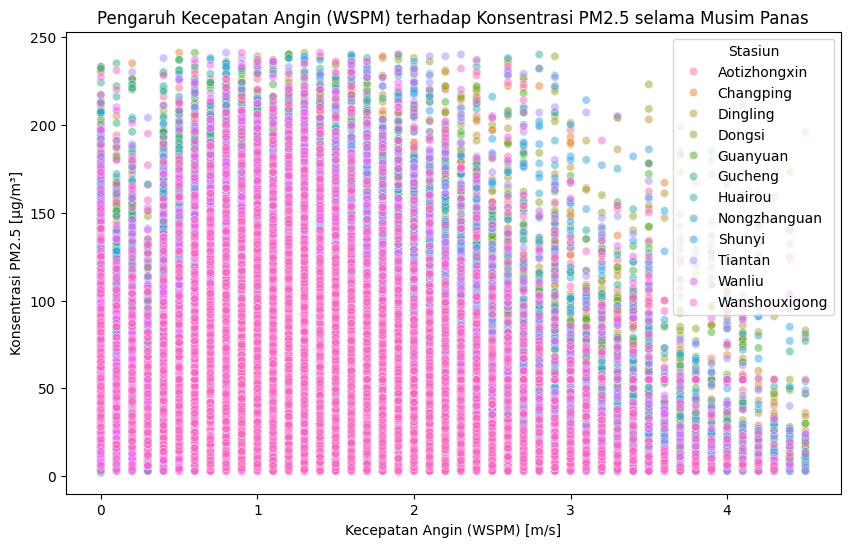

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

summer_df = combined_df[combined_df['DateTime'].dt.month.isin([6, 7, 8])]

print(f"Data musim panas memiliki {summer_df.shape[0]} baris.")

plt.figure(figsize=(10, 6))
sns.scatterplot(data=summer_df, x='WSPM', y='PM2.5', hue='station', alpha=0.5)
plt.title('Pengaruh Kecepatan Angin (WSPM) terhadap Konsentrasi PM2.5 selama Musim Panas')
plt.xlabel('Kecepatan Angin (WSPM) [m/s]')
plt.ylabel('Konsentrasi PM2.5 [µg/m³]')
plt.legend(title='Stasiun')
plt.show()

Kode di atas akan menghasilkan visualisasi scatter plot yang membandingkan kecepatan angin (WSPM) dengan konsentrasi PM2.5 di berbagai stasiun selama musim panas dengan filter pada bulan Juni, Juli, dan Agustus. Warna berbeda digunakan untuk setiap stasiun untuk melihat perbedaan pola di masing-masing lokasi.

Korelasi antara WSPM dan PM2.5 selama musim panas:
           WSPM     PM2.5
WSPM   1.000000 -0.139461
PM2.5 -0.139461  1.000000


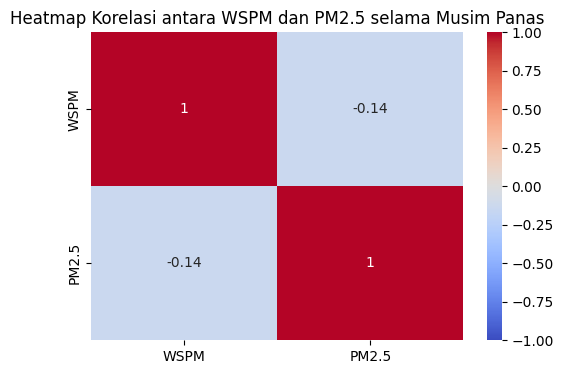

In [14]:
correlation = summer_df[['WSPM', 'PM2.5']].corr()
print("Korelasi antara WSPM dan PM2.5 selama musim panas:")
print(correlation)

plt.figure(figsize=(6, 4))
sns.heatmap(correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap Korelasi antara WSPM dan PM2.5 selama Musim Panas')
plt.show()

Kode di atas menghasilkan scatter plot yang menunjukkan hubungan antara kecepatan angin (WSPM) dan konsentrasi PM2.5 di masing-masing stasiun selama musim panas. Dari visualisasi ini, kita dapat melihat pola dan tren yang mungkin terjadi di berbagai lokasi pengukuran.

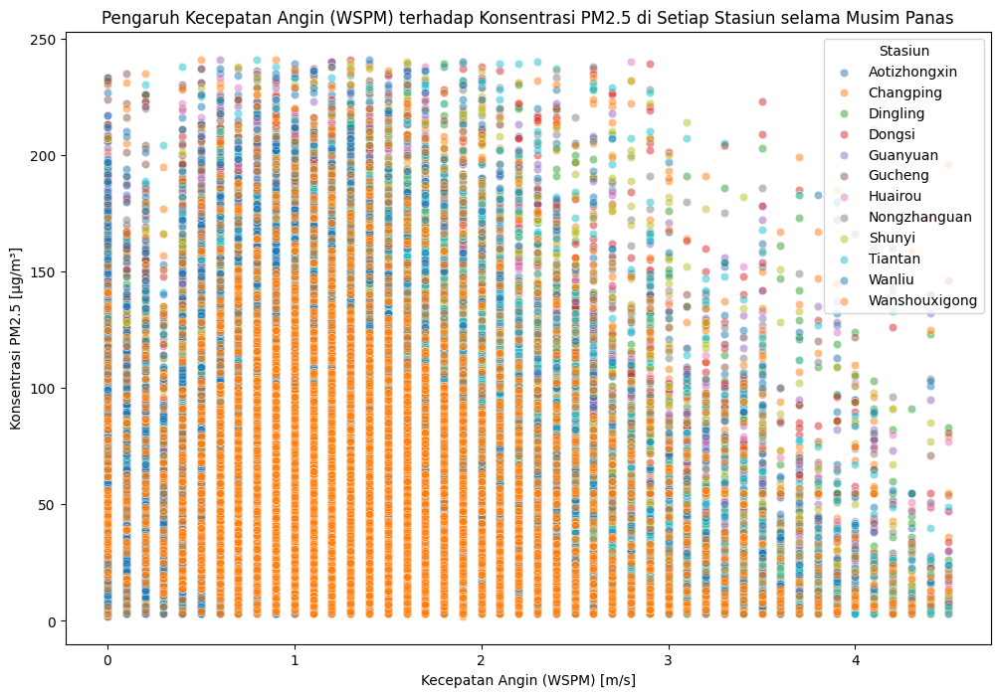

In [15]:
stations = summer_df['station'].unique()

plt.figure(figsize=(12, 8))
for station in stations:
    station_df = summer_df[summer_df['station'] == station]
    sns.scatterplot(data=station_df, x='WSPM', y='PM2.5', label=station, alpha=0.5)
plt.title('Pengaruh Kecepatan Angin (WSPM) terhadap Konsentrasi PM2.5 di Setiap Stasiun selama Musim Panas')
plt.xlabel('Kecepatan Angin (WSPM) [m/s]')
plt.ylabel('Konsentrasi PM2.5 [µg/m³]')
plt.legend(title='Stasiun')
plt.show()

**Perbandingan Stasiun**  
Kode di atas membuat scatter plot terpisah untuk setiap stasiun guna melihat perbedaan pola hubungan antara WSPM dan PM2.5 di lokasi yang berbeda.

**Insight:**  
**1. Scatter Plot: Pengaruh Kecepatan Angin (WSPM) terhadap Konsentrasi PM2.5 selama Musim Panas**  
- Pada plot pertama, terlihat bahwa pada kecepatan angin yang sangat rendah (di bawah 1 m/s), konsentrasi PM2.5 cenderung lebih tinggi, dengan banyak data yang menunjukkan konsentrasi di atas 100 µg/m³.
- Saat kecepatan angin meningkat (di atas 2 m/s), terjadi sedikit penurunan konsentrasi PM2.5. Namun, polutan PM2.5 masih terdistribusi secara luas hingga kecepatan angin mencapai 4 m/s.  

**2. Korelasi antara WSPM dan PM2.5 selama Musim Panas**  
- Korelasi antara kecepatan angin (WSPM) dan konsentrasi PM2.5 adalah -0.14. Meskipun korelasinya negatif, nilai korelasi ini cukup lemah, menunjukkan bahwa kecepatan angin bukan satu-satunya faktor yang mempengaruhi konsentrasi PM2.5.
- Heatmap korelasi menegaskan bahwa meskipun ada hubungan negatif antara WSPM dan PM2.5, pengaruhnya kecil (hanya -0.14).  

**3. Scatter Plot Pengaruh Kecepatan Angin terhadap PM2.5 di Setiap Stasiun**  
- Pada scatter plot yang memperlihatkan data dari berbagai stasiun, terlihat pola serupa seperti pada plot keseluruhan, di mana konsentrasi PM2.5 lebih tinggi pada kecepatan angin yang rendah.
- Beberapa stasiun, seperti Changping dan Huairou, menunjukkan sedikit lebih banyak variasi dalam konsentrasi PM2.5 pada kecepatan angin yang lebih tinggi.

#### 2. Pengaruh Konsentrasi NO2 dan CO terhadap Kualitas Udara di Stasiun Urban
**Pertanyaan Bisnis:**  
Bagaimana konsentrasi NO2 dan CO mempengaruhi kualitas udara secara keseluruhan di stasiun-stasiun urban selama tiga tahun terakhir?

**Langkah Analisis:**
- Filter Data untuk tiga tahun terakhir
- Visualisasi konsentrasi NO2 dan CO terhadap AQI
- Analisis korelasi antara NO2, CO, dan AQI
- Perbandingan di stasiun urban

Data tiga tahun terakhir memiliki 223871 baris.


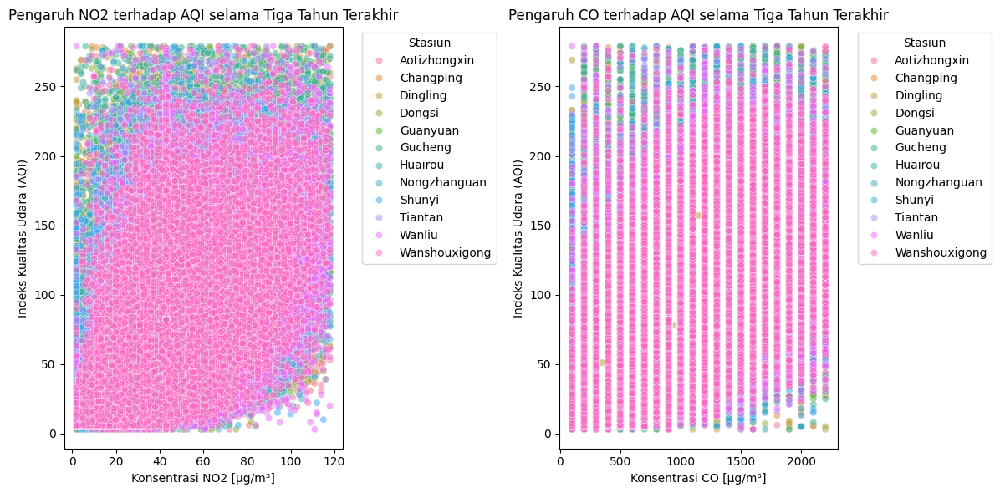

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

end_date = combined_df['DateTime'].max()
start_date = end_date - pd.DateOffset(years=3)
three_year_df = combined_df[(combined_df['DateTime'] >= start_date) & (combined_df['DateTime'] <= end_date)].copy()

print(f"Data tiga tahun terakhir memiliki {three_year_df.shape[0]} baris.")

three_year_df['AQI'] = three_year_df[['PM2.5', 'PM10']].max(axis=1)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(data=three_year_df, x='NO2', y='AQI', hue='station', alpha=0.5)
plt.title('Pengaruh NO2 terhadap AQI selama Tiga Tahun Terakhir')
plt.xlabel('Konsentrasi NO2 [µg/m³]')
plt.ylabel('Indeks Kualitas Udara (AQI)')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(1, 2, 2)
sns.scatterplot(data=three_year_df, x='CO', y='AQI', hue='station', alpha=0.5)
plt.title('Pengaruh CO terhadap AQI selama Tiga Tahun Terakhir')
plt.xlabel('Konsentrasi CO [µg/m³]')
plt.ylabel('Indeks Kualitas Udara (AQI)')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

**Filter:** Data difilter untuk hanya menyertakan tiga tahun terakhir.  
**AQI:** Karena AQI tidak tersedia, kita membuatnya berdasarkan konsentrasi PM2.5 dan PM10.  
**Scatter Plot** menunjukkan visualisasi hubungan antara NO2 dan AQI serta CO dan AQI di berbagai stasiun.  

Korelasi antara NO2, CO, dan AQI selama tiga tahun terakhir:
          NO2        CO       AQI
NO2  1.000000  0.604484  0.522868
CO   0.604484  1.000000  0.612484
AQI  0.522868  0.612484  1.000000


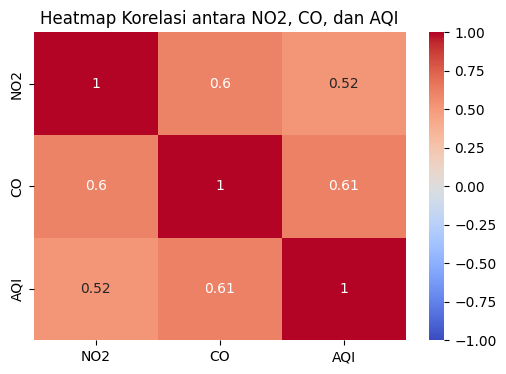

In [18]:
correlation = three_year_df[['NO2', 'CO', 'AQI']].corr()
print("Korelasi antara NO2, CO, dan AQI selama tiga tahun terakhir:")
print(correlation)

plt.figure(figsize=(6, 4))
sns.heatmap(correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap Korelasi antara NO2, CO, dan AQI')
plt.show()

**Korelasi:** Menghitung koefisien korelasi Pearson antara NO2, CO, dan AQI.  
**Heatmap:** Menampilkan visualisasi korelasi untuk memudahkan interpretasi.

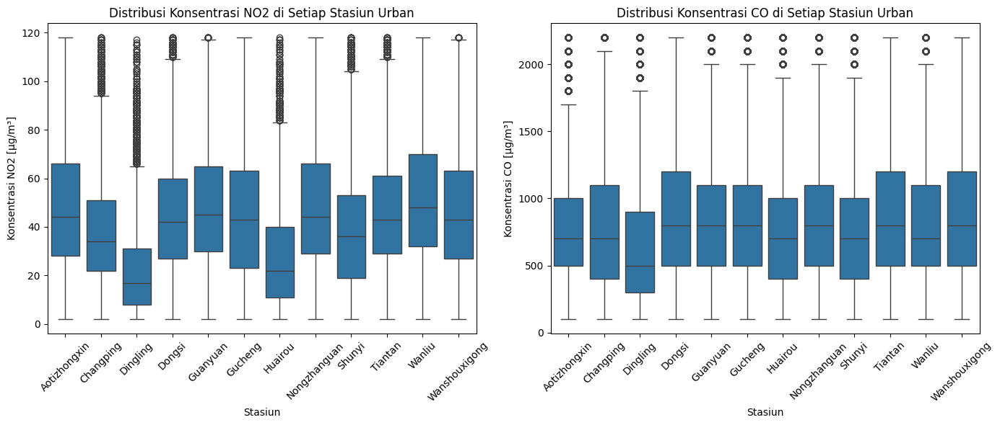

In [19]:
urban_stations = three_year_df['station'].unique()

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(data=three_year_df, x='station', y='NO2')
plt.title('Distribusi Konsentrasi NO2 di Setiap Stasiun Urban')
plt.xlabel('Stasiun')
plt.ylabel('Konsentrasi NO2 [µg/m³]')
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)
sns.boxplot(data=three_year_df, x='station', y='CO')
plt.title('Distribusi Konsentrasi CO di Setiap Stasiun Urban')
plt.xlabel('Stasiun')
plt.ylabel('Konsentrasi CO [µg/m³]')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

**Boxplot** menampilkan distribusi konsentrasi NO2 dan CO di masing-masing stasiun urban untuk melihat variasi dan outlier.

**Insight:**  
**1. Pengaruh Konsentrasi NO2 terhadap Indeks Kualitas Udara (AQI)**  
- Scatter plot menunjukkan bahwa seiring dengan meningkatnya konsentrasi NO2, AQI cenderung meningkat.
- Sebagian besar data menunjukkan konsentrasi NO2 dalam kisaran 0 hingga 60 µg/m³, dengan beberapa data mencapai hingga 120 µg/m³.
- Indeks Kualitas Udara (AQI) untuk sebagian besar titik data berada di atas 50, dan pada konsentrasi NO2 yang lebih tinggi, AQI sering kali mencapai lebih dari 100, yang menandakan penurunan kualitas udara.  

**2. Pengaruh Konsentrasi CO terhadap Indeks Kualitas Udara (AQI)**  
- Scatter plot antara konsentrasi CO dan AQI menunjukkan pola yang serupa, di mana konsentrasi CO yang lebih tinggi cenderung berkorelasi dengan AQI yang lebih tinggi.
- Sebagian besar data konsentrasi CO berkisar antara 0 hingga 1000 µg/m³, tetapi terdapat beberapa outlier dengan konsentrasi CO yang sangat tinggi, hingga lebih dari 2000 µg/m³.  

**3. Heatmap Korelasi antara NO2, CO, dan AQI**  
- Korelasi antara NO2 dan AQI adalah 0.52, menunjukkan korelasi positif yang cukup kuat, artinya semakin tinggi konsentrasi NO2, semakin buruk kualitas udara (AQI meningkat).
- Korelasi antara CO dan AQI adalah 0.61, yang bahkan lebih tinggi dari NO2, menunjukkan bahwa CO juga sangat memengaruhi kualitas udara di wilayah urban.  

**4. Distribusi Konsentrasi NO2 di Setiap Stasiun Urban (Boxplot)**  
- Stasiun seperti Wanshouxigong, Changping, dan Tiantan menunjukkan konsentrasi NO2 yang lebih tinggi, dengan banyak outlier yang mencapai lebih dari 80 µg/m³.
- Sebagian besar stasiun lainnya memiliki konsentrasi NO2 yang lebih rendah, dengan median konsentrasi yang berkisar antara 30 hingga 50 µg/m³.  

**5. Distribusi Konsentrasi CO di Setiap Stasiun Urban (Boxplot)**  
- Changping, Wanshouxigong, dan Wanliu memiliki distribusi konsentrasi CO yang tinggi, dengan median konsentrasi berkisar antara 800 hingga 1000 µg/m³.
- Terdapat banyak outlier di berbagai stasiun dengan konsentrasi CO yang sangat tinggi, melebihi 2000 µg/m³ di beberapa kasus.

#### 3. Pengaruh suhu (TEMP) dan kelembaban udara (DEWP) terhadap konsentrasi PM10 dan SO2 di berbagai stasiun pengukuran selama lima tahun terakhir
**Pertanyaan Bisnis:**  
Bagaimana pengaruh suhu (TEMP) dan kelembaban udara (DEWP) terhadap konsentrasi PM10 dan SO2 di berbagai stasiun pengukuran selama lima tahun terakhir?

**Langkah Analisis:**  
- Filter Data untuk Lima Tahun Terakhir
- Visualisasi Hubungan antara TEMP, DEWP dengan PM10 dan SO2
- Analisis Korelasi antara Variabel
- Perbandingan di Berbagai Stasiun Pengukuran
- Statistik Deskriptif Berdasarkan Kondisi Cuaca
- Visualisasi Distribusi Polutan berdasarkan Kondisi Cuaca

**Filter Data untuk Lima Tahun Terakhir**  
Pertama, kita akan memfilter dataset untuk hanya menyertakan data dalam lima tahun terakhir.

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

end_date = combined_df['DateTime'].max()
start_date = end_date - pd.DateOffset(years=5)
five_year_df = combined_df[(combined_df['DateTime'] >= start_date) & (combined_df['DateTime'] <= end_date)].copy()

print(f"Data lima tahun terakhir memiliki {five_year_df.shape[0]} baris dan {five_year_df.shape[1]} kolom.")

Data lima tahun terakhir memiliki 289703 baris dan 19 kolom.


`copy()` digunakan untuk memastikan bahwa five_year_df adalah salinan independen dari combined_df, mencegah SettingWithCopyWarning.  
`start_date` dan `end_date` menentukan rentang waktu lima tahun terakhir.

**Visualisasi Hubungan antara TEMP, DEWP dengan PM10 dan SO2**  
Selanjutnya, kita akan membuat visualisasi untuk memahami hubungan antara suhu, kelembaban udara, dan konsentrasi polutan PM10 serta SO2.

**a. Scatter Plot: TEMP vs PM10 dan SO2**

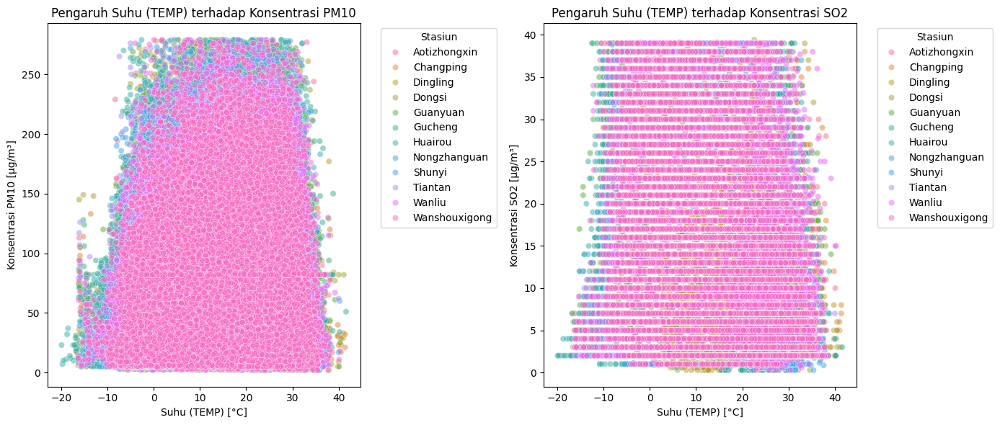

In [26]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(data=five_year_df, x='TEMP', y='PM10', hue='station', alpha=0.5)
plt.title('Pengaruh Suhu (TEMP) terhadap Konsentrasi PM10')
plt.xlabel('Suhu (TEMP) [°C]')
plt.ylabel('Konsentrasi PM10 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(1, 2, 2)
sns.scatterplot(data=five_year_df, x='TEMP', y='SO2', hue='station', alpha=0.5)
plt.title('Pengaruh Suhu (TEMP) terhadap Konsentrasi SO2')
plt.xlabel('Suhu (TEMP) [°C]')
plt.ylabel('Konsentrasi SO2 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

Scatter Plot menunjukkan distribusi dan potensi hubungan antara suhu dengan PM10 dan SO2 di berbagai stasiun.  
Hue digunakan untuk membedakan data berdasarkan stasiun pengukuran.

**b. Scatter Plot: DEWP vs PM10 dan SO2**

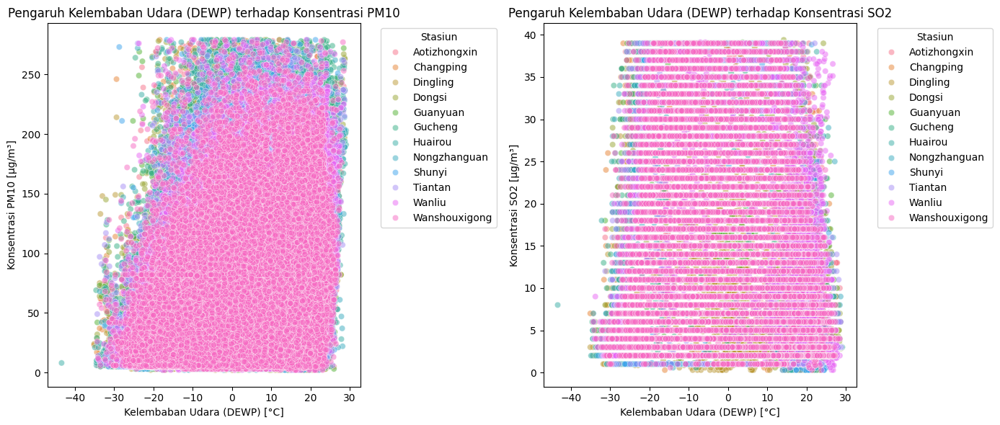

In [27]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(data=five_year_df, x='DEWP', y='PM10', hue='station', alpha=0.5)
plt.title('Pengaruh Kelembaban Udara (DEWP) terhadap Konsentrasi PM10')
plt.xlabel('Kelembaban Udara (DEWP) [°C]')
plt.ylabel('Konsentrasi PM10 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(1, 2, 2)
sns.scatterplot(data=five_year_df, x='DEWP', y='SO2', hue='station', alpha=0.5)
plt.title('Pengaruh Kelembaban Udara (DEWP) terhadap Konsentrasi SO2')
plt.xlabel('Kelembaban Udara (DEWP) [°C]')
plt.ylabel('Konsentrasi SO2 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

Scatter Plot ini membantu dalam melihat bagaimana kelembaban udara mempengaruhi konsentrasi PM10 dan SO2 di berbagai stasiun.

**Analisis Korelasi antara Variabel**  
Menghitung koefisien korelasi Pearson antara TEMP, DEWP dengan PM10 dan SO2.

**a. Korelasi Suhu (TEMP) dengan PM10 dan SO2**

Korelasi antara TEMP dan PM10: 0.1609
Korelasi antara TEMP dan SO2: -0.2831


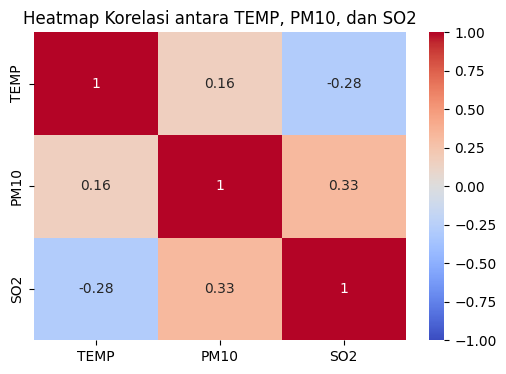

In [29]:
corr_temp_pm10 = five_year_df['TEMP'].corr(five_year_df['PM10'])
corr_temp_so2 = five_year_df['TEMP'].corr(five_year_df['SO2'])

print(f"Korelasi antara TEMP dan PM10: {corr_temp_pm10:.4f}")
print(f"Korelasi antara TEMP dan SO2: {corr_temp_so2:.4f}")

plt.figure(figsize=(6, 4))
corr_matrix = five_year_df[['TEMP', 'PM10', 'SO2']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap Korelasi antara TEMP, PM10, dan SO2')
plt.show()

**b. Korelasi Kelembaban Udara (DEWP) dengan PM10 dan SO2**

Korelasi antara DEWP dan PM10: 0.2839
Korelasi antara DEWP dan SO2: -0.2790


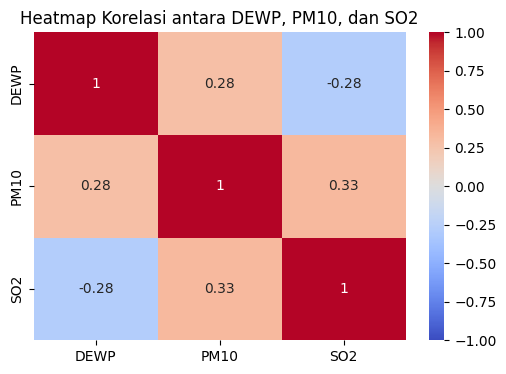

In [30]:
corr_dewp_pm10 = five_year_df['DEWP'].corr(five_year_df['PM10'])
corr_dewp_so2 = five_year_df['DEWP'].corr(five_year_df['SO2'])

print(f"Korelasi antara DEWP dan PM10: {corr_dewp_pm10:.4f}")
print(f"Korelasi antara DEWP dan SO2: {corr_dewp_so2:.4f}")

plt.figure(figsize=(6, 4))
corr_matrix_dewp = five_year_df[['DEWP', 'PM10', 'SO2']].corr()
sns.heatmap(corr_matrix_dewp, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap Korelasi antara DEWP, PM10, dan SO2')
plt.show()

**Korelasi Pearson** mengukur kekuatan dan arah hubungan linear antara dua variabel.  
**Heatmap** memberikan visualisasi yang mudah dipahami mengenai korelasi antar variabel.

**Perbandingan di Berbagai Stasiun Pengukuran**  
Menganalisis apakah hubungan antara TEMP, DEWP dengan PM10 dan SO2 berbeda di berbagai stasiun pengukuran.

**a. Scatter Plot Per Stasiun**

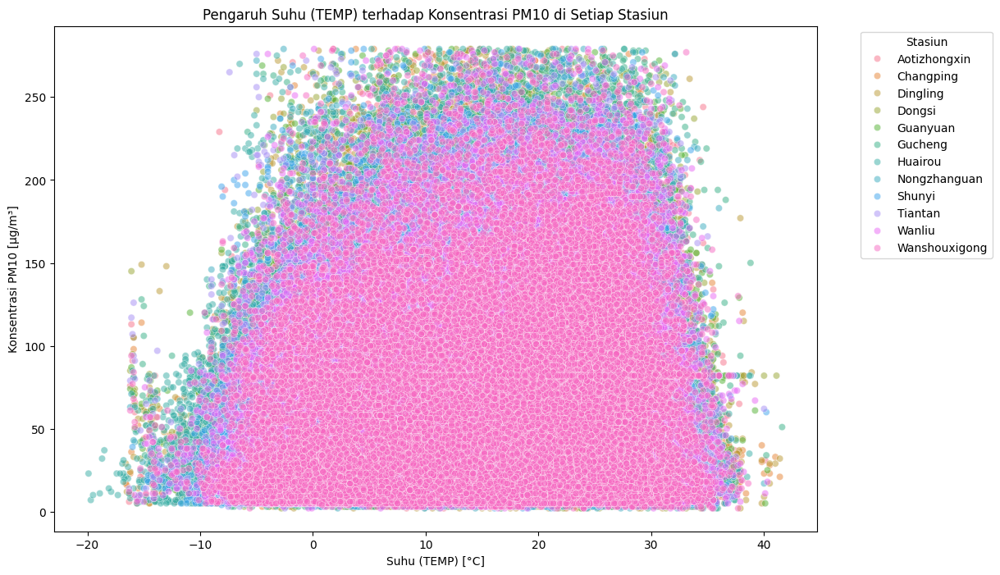

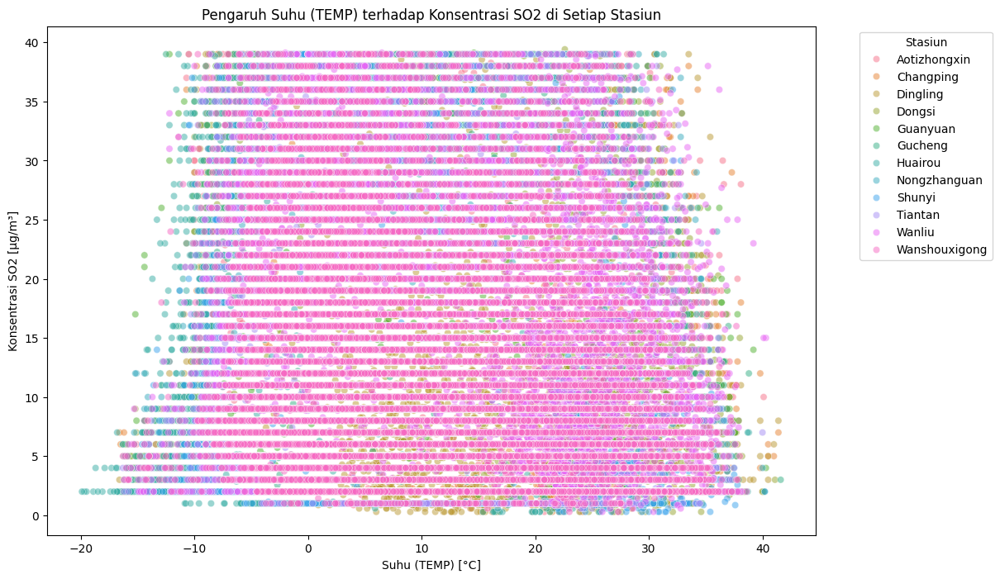

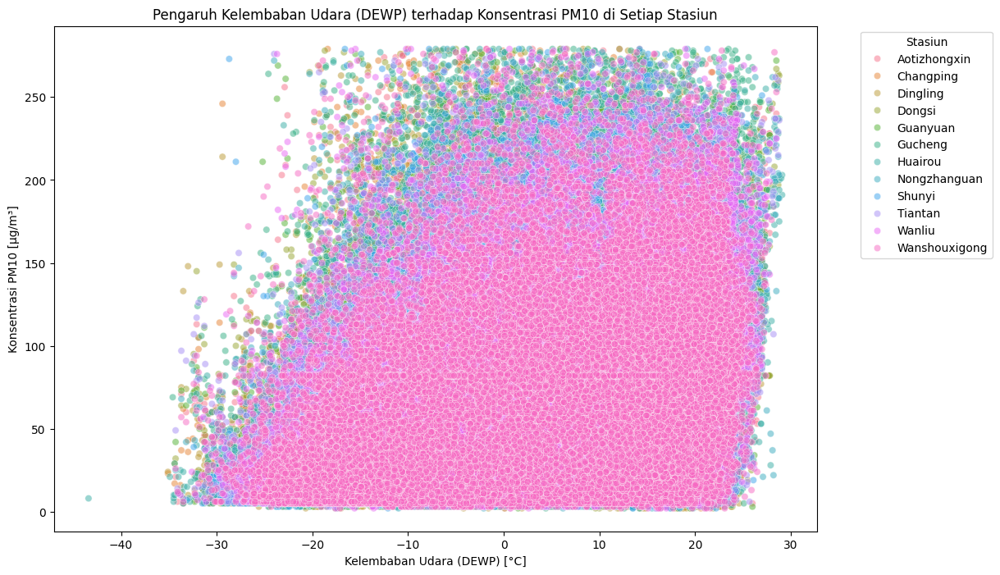

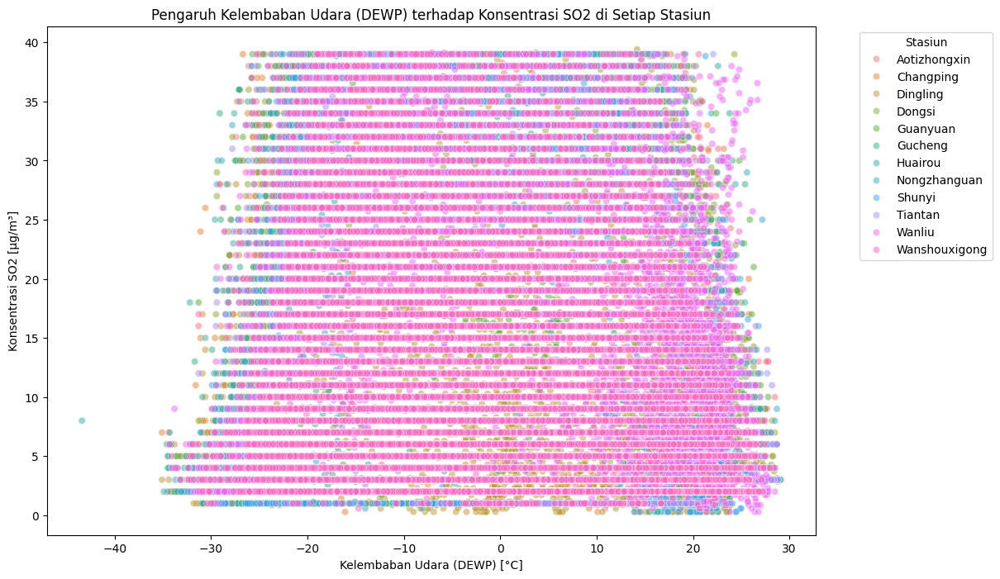

In [31]:
plt.figure(figsize=(12, 8))
sns.scatterplot(data=five_year_df, x='TEMP', y='PM10', hue='station', alpha=0.5)
plt.title('Pengaruh Suhu (TEMP) terhadap Konsentrasi PM10 di Setiap Stasiun')
plt.xlabel('Suhu (TEMP) [°C]')
plt.ylabel('Konsentrasi PM10 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

plt.figure(figsize=(12, 8))
sns.scatterplot(data=five_year_df, x='TEMP', y='SO2', hue='station', alpha=0.5)
plt.title('Pengaruh Suhu (TEMP) terhadap Konsentrasi SO2 di Setiap Stasiun')
plt.xlabel('Suhu (TEMP) [°C]')
plt.ylabel('Konsentrasi SO2 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

plt.figure(figsize=(12, 8))
sns.scatterplot(data=five_year_df, x='DEWP', y='PM10', hue='station', alpha=0.5)
plt.title('Pengaruh Kelembaban Udara (DEWP) terhadap Konsentrasi PM10 di Setiap Stasiun')
plt.xlabel('Kelembaban Udara (DEWP) [°C]')
plt.ylabel('Konsentrasi PM10 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

plt.figure(figsize=(12, 8))
sns.scatterplot(data=five_year_df, x='DEWP', y='SO2', hue='station', alpha=0.5)
plt.title('Pengaruh Kelembaban Udara (DEWP) terhadap Konsentrasi SO2 di Setiap Stasiun')
plt.xlabel('Kelembaban Udara (DEWP) [°C]')
plt.ylabel('Konsentrasi SO2 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

**Scatter Plot** per Stasiun membantu dalam mengidentifikasi apakah hubungan antara variabel berbeda di berbagai lokasi pengukuran.  
**Hue** membedakan data berdasarkan stasiun, untuk memvisualisasikan perbedaan pola di tiap lokasi.

**b. Facet Grid untuk Scatter Plot**  
Menggunakan FacetGrid untuk membuat plot yang terpisah per stasiun.

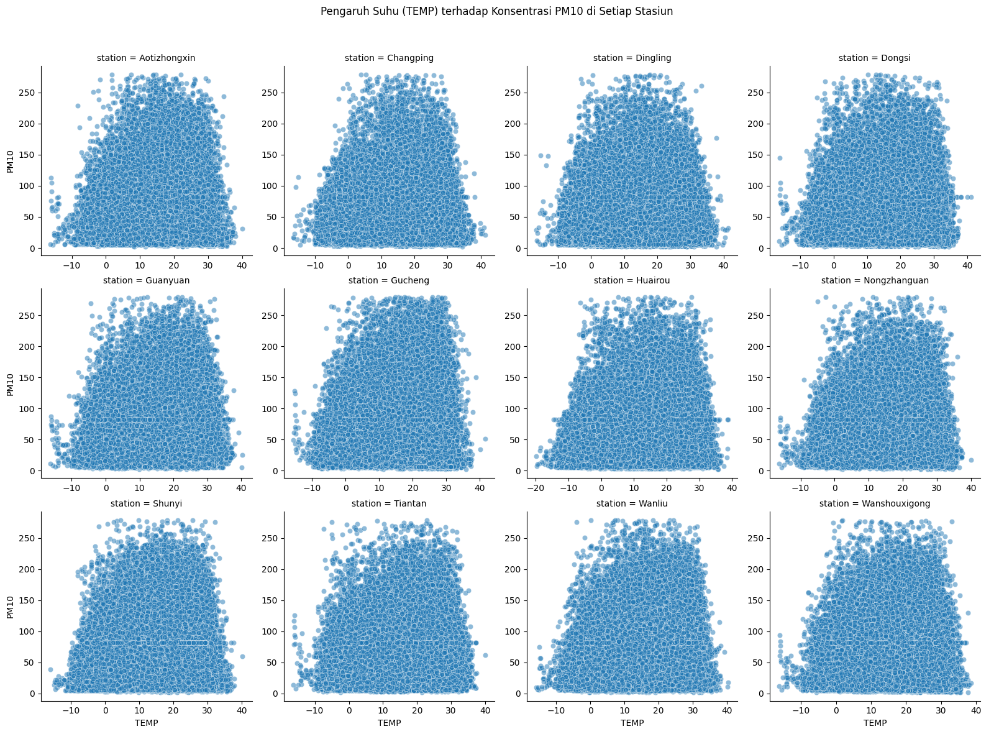

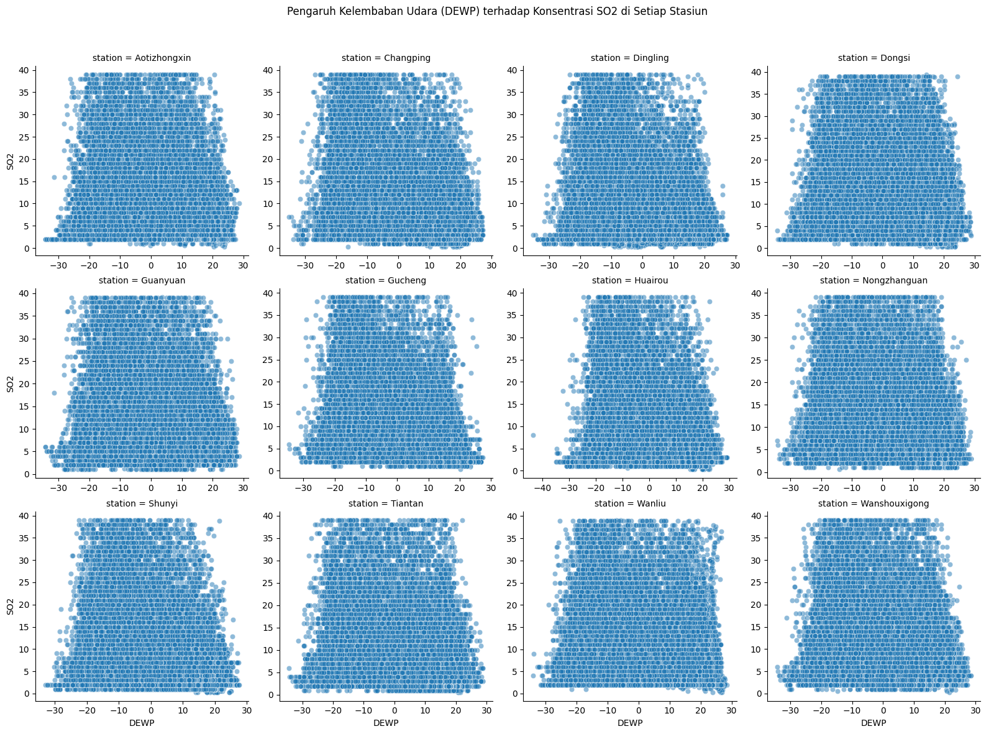

In [32]:
g = sns.FacetGrid(five_year_df, col="station", col_wrap=4, height=4, sharex=False, sharey=False)
g.map(sns.scatterplot, "TEMP", "PM10", alpha=0.5)
g.add_legend()
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Pengaruh Suhu (TEMP) terhadap Konsentrasi PM10 di Setiap Stasiun')
plt.show()

g = sns.FacetGrid(five_year_df, col="station", col_wrap=4, height=4, sharex=False, sharey=False)
g.map(sns.scatterplot, "DEWP", "SO2", alpha=0.5)
g.add_legend()
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Pengaruh Kelembaban Udara (DEWP) terhadap Konsentrasi SO2 di Setiap Stasiun')
plt.show()

**FacetGrid** memungkinkan pembuatan multiple plot yang terpisah untuk setiap stasiun dalam satu grid, memudahkan perbandingan antar stasiun.

**Statistik Deskriptif Berdasarkan Kondisi Cuaca**  
Menganalisis statistik deskriptif untuk PM10 dan SO2 berdasarkan rentang suhu dan kelembaban.

**a. Mengelompokkan Data Berdasarkan Rentang Suhu dan Kelembaban**

In [34]:
five_year_df['Kategori_Temp'] = pd.cut(five_year_df['TEMP'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

five_year_df['Kategori_DEWP'] = pd.cut(five_year_df['DEWP'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

print(five_year_df[['TEMP', 'Kategori_Temp', 'DEWP', 'Kategori_DEWP']].head())

   TEMP Kategori_Temp  DEWP Kategori_DEWP
0  -0.7           Low -18.8           Low
3  -1.4           Low -19.4           Low
4  -2.0           Low -19.5           Low
5  -2.2           Low -19.6           Low
6  -2.6           Low -19.1           Low


**b. Statistik Deskriptif per Kategori Suhu dan Kelembaban**

In [45]:
stats_temp = five_year_df.groupby('Kategori_Temp', observed=True)[['PM10', 'SO2']].describe()
print("Statistik Deskriptif PM10 dan SO2 per Kategori Suhu:")
print(stats_temp)

stats_dewp = five_year_df.groupby('Kategori_DEWP', observed=True)[['PM10', 'SO2']].describe()
print("\nStatistik Deskriptif PM10 dan SO2 per Kategori Kelembaban:")
print(stats_dewp)

Statistik Deskriptif PM10 dan SO2 per Kategori Suhu:
                   PM10                                                       \
                  count       mean        std  min   25%   50%    75%    max   
Kategori_Temp                                                                  
Very Low         3306.0  37.653448  28.280098  4.0  16.0  30.0   53.0  229.0   
Low             64320.0  56.179717  46.708499  2.0  19.0  41.0   82.0  279.0   
Medium          81405.0  80.714473  59.392504  2.0  31.0  69.0  118.0  279.0   
High           121789.0  84.348155  55.406340  2.0  39.0  77.0  119.0  279.0   
Very High       18883.0  63.740221  50.519908  2.0  22.0  51.0   90.0  278.0   

                    SO2                                                         
                  count       mean       std     min  25%   50%   75%      max  
Kategori_Temp                                                                   
Very Low         3306.0  10.804634  9.180519  1.0000  4.0   7.0

**Kategori Suhu dan Kelembaban:** Mengelompokkan data suhu dan kelembaban ke dalam beberapa kategori untuk analisis yang lebih terstruktur.  
**Statistik Deskriptif:** Memahami distribusi PM10 dan SO2 dalam setiap kategori suhu dan kelembaban.

**Visualisasi Distribusi Polutan berdasarkan Kondisi Cuaca**  

**a. Boxplot PM10 dan SO2 berdasarkan Kategori Suhu**

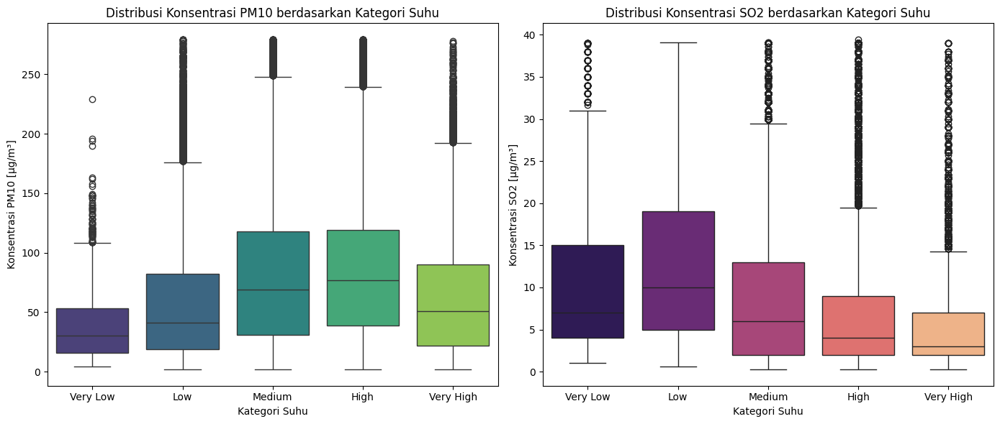

In [43]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(data=five_year_df, x='Kategori_Temp', y='PM10', palette='viridis', hue='Kategori_Temp', legend=False)
plt.title('Distribusi Konsentrasi PM10 berdasarkan Kategori Suhu')
plt.xlabel('Kategori Suhu')
plt.ylabel('Konsentrasi PM10 [µg/m³]')

plt.subplot(1, 2, 2)
sns.boxplot(data=five_year_df, x='Kategori_Temp', y='SO2', palette='magma', hue='Kategori_Temp', legend=False)
plt.title('Distribusi Konsentrasi SO2 berdasarkan Kategori Suhu')
plt.xlabel('Kategori Suhu')
plt.ylabel('Konsentrasi SO2 [µg/m³]')

plt.tight_layout()
plt.show()

**b. Boxplot PM10 dan SO2 berdasarkan Kategori Kelembaban**

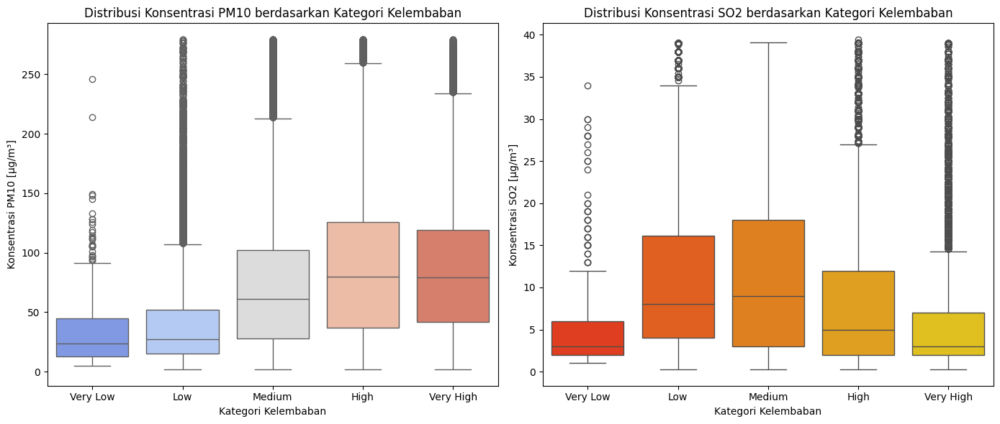

In [44]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(data=five_year_df, x='Kategori_DEWP', y='PM10', palette='coolwarm', hue='Kategori_DEWP', legend=False)
plt.title('Distribusi Konsentrasi PM10 berdasarkan Kategori Kelembaban')
plt.xlabel('Kategori Kelembaban')
plt.ylabel('Konsentrasi PM10 [µg/m³]')

plt.subplot(1, 2, 2)
sns.boxplot(data=five_year_df, x='Kategori_DEWP', y='SO2', palette='autumn', hue='Kategori_DEWP', legend=False)
plt.title('Distribusi Konsentrasi SO2 berdasarkan Kategori Kelembaban')
plt.xlabel('Kategori Kelembaban')
plt.ylabel('Konsentrasi SO2 [µg/m³]')

plt.tight_layout()
plt.show()

**Boxplot** membantu dalam melihat distribusi dan variabilitas konsentrasi polutan di setiap kategori suhu dan kelembaban.  
**Palette** digunakan untuk memberikan variasi warna yang berbeda pada setiap plot.

**Insight:**  
**1. Distribusi Konsentrasi PM10 Berdasarkan Kategori Suhu**  
- Konsentrasi PM10 meningkat seiring dengan peningkatan kategori suhu. Pada suhu "Very Low" (sangat rendah), median konsentrasi PM10 berada di sekitar 50 µg/m³, sedangkan pada suhu "High" dan "Very High", median konsentrasinya melebihi 100 µg/m³.
- Suhu yang lebih tinggi menyebabkan peningkatan konsentrasi PM10, dan rentang distribusi PM10 juga lebih besar pada suhu yang lebih tinggi.  

**2. Distribusi Konsentrasi SO2 Berdasarkan Kategori Suhu**  
- Konsentrasi SO2 menurun secara konsisten seiring peningkatan kategori suhu. Pada suhu "Very Low", median konsentrasi SO2 berada di sekitar 10 µg/m³, namun pada suhu "Very High", median konsentrasinya turun menjadi sekitar 5 µg/m³.
- Pada kategori suhu yang lebih rendah, terdapat lebih banyak outlier dengan konsentrasi SO2 yang tinggi, menandakan adanya periode dengan lonjakan SO2 pada suhu yang rendah.  

**3. Distribusi Konsentrasi PM10 Berdasarkan Kategori Kelembaban Udara (DEWP)**  
- Konsentrasi PM10 cenderung meningkat dengan kelembaban yang lebih tinggi. Pada kategori kelembaban "Very Low", median konsentrasi PM10 berada di bawah 50 µg/m³, namun pada kategori "High" dan "Very High", median konsentrasinya mendekati atau melebihi 100 µg/m³.
- Ada lebih banyak outlier pada kategori kelembaban yang lebih rendah, tetapi rentang distribusi lebih besar pada kelembaban yang tinggi.  

**4. Distribusi Konsentrasi SO2 Berdasarkan Kategori Kelembaban Udara (DEWP)**  
- Konsentrasi SO2 juga menurun seiring peningkatan kelembaban udara. Pada kategori kelembaban "Very Low", median konsentrasi SO2 lebih dari 10 µg/m³, sementara pada kategori "Very High", median konsentrasinya turun menjadi sekitar 5 µg/m³.
- Ada lebih banyak outlier pada kelembaban yang lebih rendah, menandakan adanya lonjakan konsentrasi SO2 pada kelembaban rendah.  

**5. Statistik Deskriptif PM10 dan SO2 Berdasarkan Kategori Suhu**  
- PM10: Rata-rata konsentrasi PM10 tertinggi ditemukan pada suhu "High" dan "Very High", yang mendukung pola yang terlihat pada boxplot sebelumnya.
- SO2: Rata-rata konsentrasi SO2 tertinggi ditemukan pada kategori suhu "Very Low" dan "Low", sedangkan pada kategori suhu "Very High", rata-rata konsentrasinya turun signifikan.  

**6. Statistik Deskriptif PM10 dan SO2 Berdasarkan Kategori Kelembaban Udara (DEWP)**  
- PM10: Rata-rata konsentrasi PM10 meningkat pada kategori kelembaban yang lebih tinggi, dengan nilai tertinggi pada kategori "High" dan "Very High".
- SO2: Sebaliknya, rata-rata konsentrasi SO2 lebih tinggi pada kelembaban rendah dan menurun pada kelembaban yang lebih tinggi.

## Visualization & Explanatory Analysis  

Pada bagian ini, kita akan menyajikan visualisasi yang lebih mendalam serta menganalisis temuan utama dari tahap EDA. Analisis ini bertujuan untuk memberikan pemahaman yang lebih jelas mengenai dampak variabel-variabel tertentu terhadap kualitas udara berdasarkan pertanyaan bisnis yang telah ditentukan.


### Pertanyaan 1: Bagaimana pengaruh kecepatan angin (WSPM) terhadap penyebaran konsentrasi PM2.5 selama musim Panas (Juni hingga Agustus) di masing-masing stasiun pengukuran?

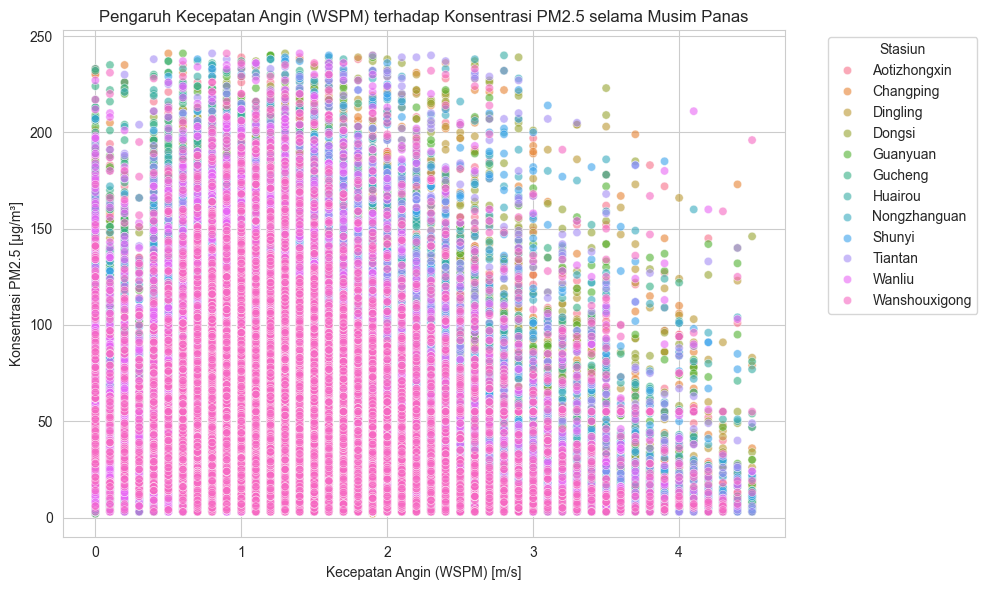

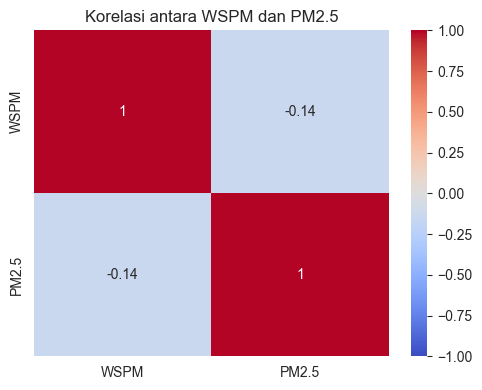

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data untuk musim panas (Juni, Juli, Agustus)
summer_df = combined_df[combined_df['DateTime'].dt.month.isin([6, 7, 8])]

# Scatter Plot: WSPM vs PM2.5 dengan hue berdasarkan stasiun
plt.figure(figsize=(10, 6))
sns.scatterplot(data=summer_df, x='WSPM', y='PM2.5', hue='station', alpha=0.6)
plt.title('Pengaruh Kecepatan Angin (WSPM) terhadap Konsentrasi PM2.5 selama Musim Panas')
plt.xlabel('Kecepatan Angin (WSPM) [m/s]')
plt.ylabel('Konsentrasi PM2.5 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Heatmap Korelasi antara WSPM dan PM2.5
plt.figure(figsize=(5, 4))
corr = summer_df[['WSPM', 'PM2.5']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Korelasi antara WSPM dan PM2.5')
plt.tight_layout()
plt.show()

### Pertanyaan 2: Bagaimana konsentrasi NO2 dan CO mempengaruhi kualitas udara secara keseluruhan di stasiun-stasiun urban selama tiga tahun terakhir?

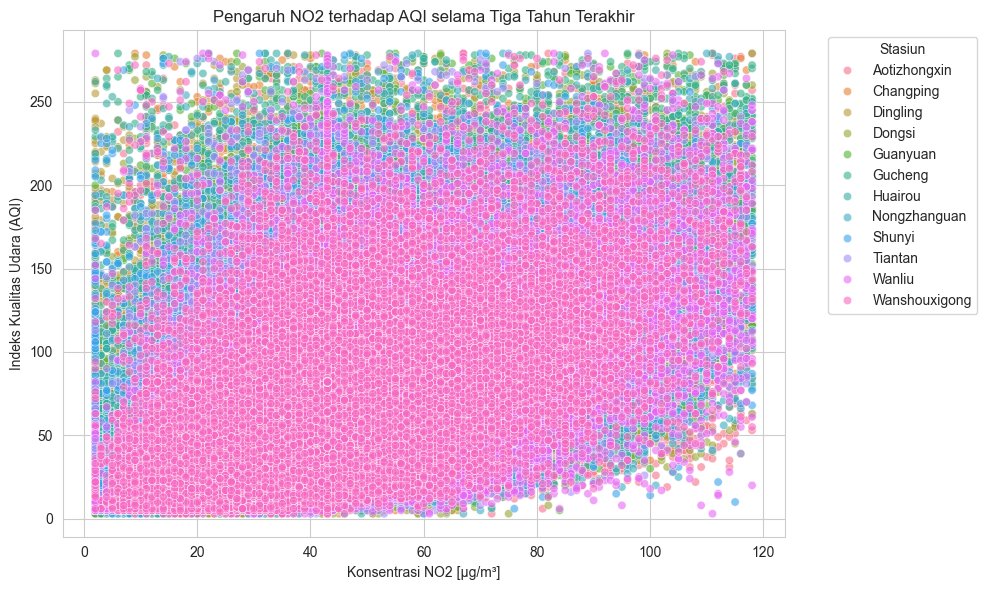

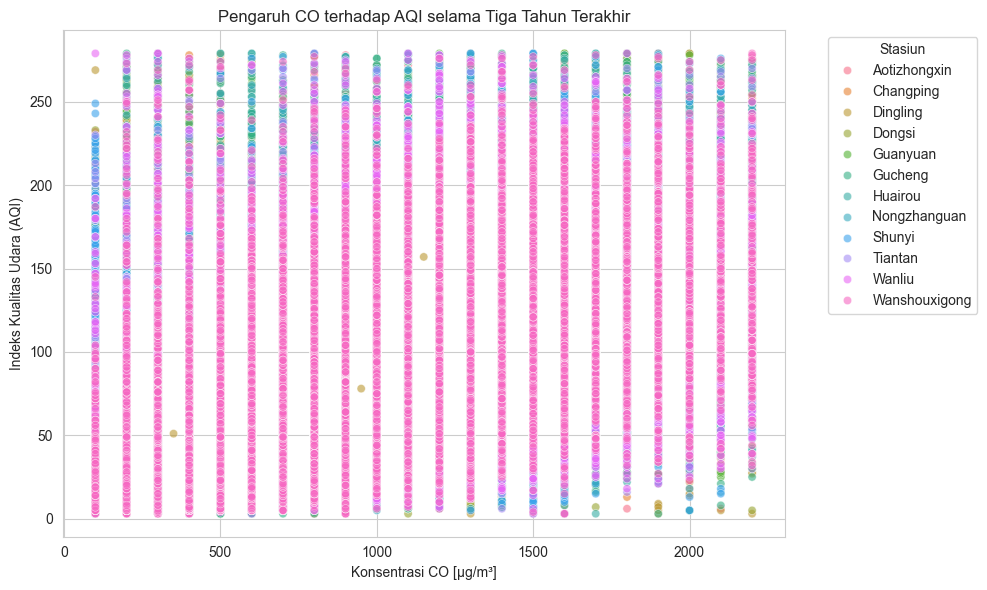

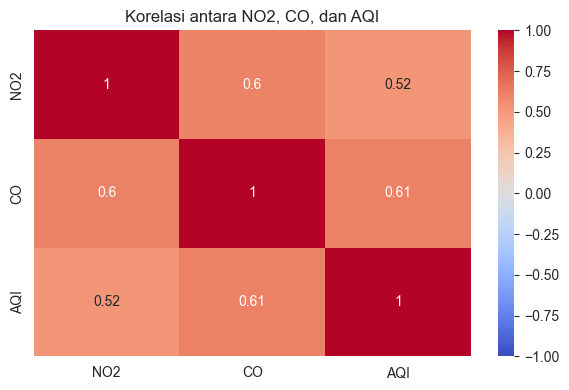

In [53]:
# Filter data untuk tiga tahun terakhir
end_date = combined_df['DateTime'].max()
start_date = end_date - pd.DateOffset(years=3)
three_year_df = combined_df[(combined_df['DateTime'] >= start_date) & (combined_df['DateTime'] <= end_date)].copy()

# Membuat kolom AQI sederhana berdasarkan PM2.5 dan PM10
three_year_df['AQI'] = three_year_df[['PM2.5', 'PM10']].max(axis=1)

# Scatter Plot: NO2 vs AQI
plt.figure(figsize=(10, 6))
sns.scatterplot(data=three_year_df, x='NO2', y='AQI', hue='station', alpha=0.6)
plt.title('Pengaruh NO2 terhadap AQI selama Tiga Tahun Terakhir')
plt.xlabel('Konsentrasi NO2 [µg/m³]')
plt.ylabel('Indeks Kualitas Udara (AQI)')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Scatter Plot: CO vs AQI
plt.figure(figsize=(10, 6))
sns.scatterplot(data=three_year_df, x='CO', y='AQI', hue='station', alpha=0.6)
plt.title('Pengaruh CO terhadap AQI selama Tiga Tahun Terakhir')
plt.xlabel('Konsentrasi CO [µg/m³]')
plt.ylabel('Indeks Kualitas Udara (AQI)')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Heatmap Korelasi antara NO2, CO, dan AQI
plt.figure(figsize=(6, 4))
corr = three_year_df[['NO2', 'CO', 'AQI']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Korelasi antara NO2, CO, dan AQI')
plt.tight_layout()
plt.show()

### Pertanyaan 3: Bagaimana pengaruh suhu (TEMP) dan kelembaban udara (DEWP) terhadap konsentrasi PM10 dan SO2 di berbagai stasiun pengukuran selama lima tahun terakhir?

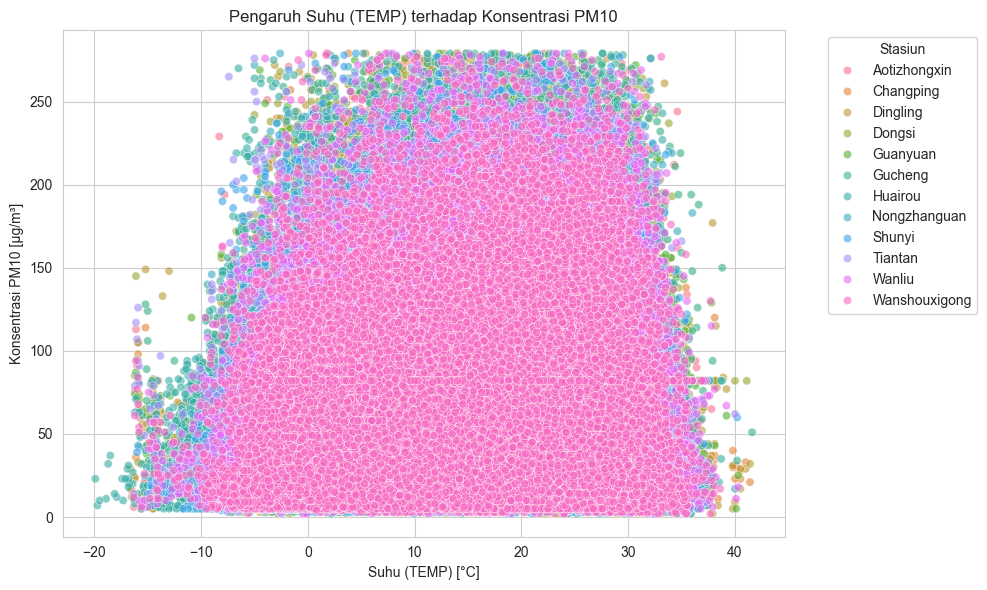

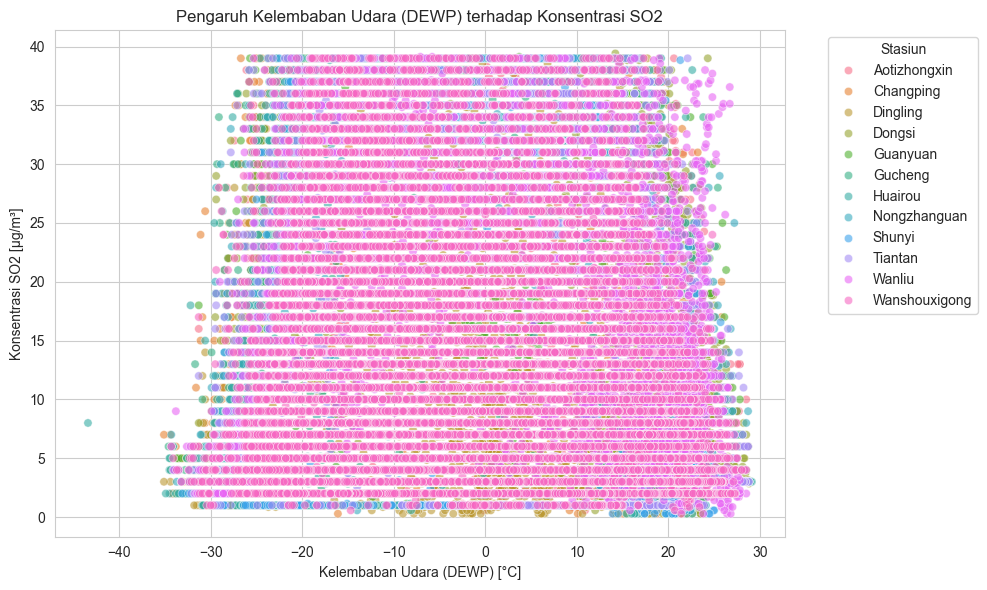

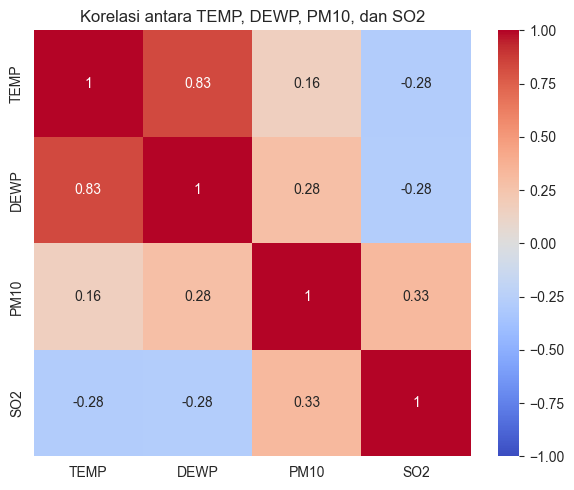

In [51]:
# Filter data untuk lima tahun terakhir
start_date_5yr = end_date - pd.DateOffset(years=5)
five_year_df = combined_df[(combined_df['DateTime'] >= start_date_5yr) & (combined_df['DateTime'] <= end_date)]

# Scatter Plot: TEMP vs PM10
plt.figure(figsize=(10, 6))
sns.scatterplot(data=five_year_df, x='TEMP', y='PM10', hue='station', alpha=0.6)
plt.title('Pengaruh Suhu (TEMP) terhadap Konsentrasi PM10')
plt.xlabel('Suhu (TEMP) [°C]')
plt.ylabel('Konsentrasi PM10 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Scatter Plot: DEWP vs SO2
plt.figure(figsize=(10, 6))
sns.scatterplot(data=five_year_df, x='DEWP', y='SO2', hue='station', alpha=0.6)
plt.title('Pengaruh Kelembaban Udara (DEWP) terhadap Konsentrasi SO2')
plt.xlabel('Kelembaban Udara (DEWP) [°C]')
plt.ylabel('Konsentrasi SO2 [µg/m³]')
plt.legend(title='Stasiun', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Heatmap Korelasi antara TEMP, DEWP, PM10, dan SO2
plt.figure(figsize=(6, 5))
corr = five_year_df[['TEMP', 'DEWP', 'PM10', 'SO2']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Korelasi antara TEMP, DEWP, PM10, dan SO2')
plt.tight_layout()
plt.show()

**Insight:**  
**1. Pengaruh Kecepatan Angin (WSPM) terhadap Konsentrasi PM2.5:**  
- Pada kecepatan angin rendah (< 1 m/s), terlihat bahwa konsentrasi PM2.5 cenderung lebih tinggi di hampir semua stasiun pengukuran. Hal ini menunjukkan bahwa ketika angin lemah, partikel PM2.5 cenderung terakumulasi di atmosfer.
- Pada kecepatan angin yang lebih tinggi (> 3 m/s), konsentrasi PM2.5 cenderung sedikit menurun, namun tidak signifikan. Ini menunjukkan bahwa peningkatan kecepatan angin dapat sedikit membantu penyebaran polutan, tetapi pengaruhnya tidak terlalu besar.
- Heatmap korelasi menunjukkan bahwa korelasi antara kecepatan angin (WSPM) dan konsentrasi PM2.5 adalah -0.14, yang merupakan korelasi negatif lemah.

**2. Pengaruh Konsentrasi NO2 dan CO terhadap Kualitas Udara di Stasiun Urban:**
- Pada konsentrasi NO2 lebih dari 40 µg/m³, kualitas udara secara umum sangat buruk (AQI di atas 150). Ini menunjukkan bahwa NO2 adalah salah satu faktor utama yang memengaruhi kualitas udara.
- Hampir semua stasiun memiliki pola serupa, tetapi Wanshouxigong terlihat memiliki konsentrasi NO2 dan AQI yang tinggi.
- Pada konsentrasi CO di atas 1000 µg/m³, AQI hampir selalu berada di atas 150, menunjukkan kondisi kualitas udara yang tidak sehat. Dengan meningkatnya konsentrasi CO, kualitas udara semakin buruk.
- Beberapa stasiun seperti Wanshouxigong juga mendominasi dengan konsentrasi CO yang tinggi dan kualitas udara yang buruk.
- Korelasi antara NO2 dan AQI adalah 0.52, yang menunjukkan hubungan positif moderat. Ini berarti bahwa peningkatan NO2 secara konsisten berkorelasi dengan penurunan kualitas udara (AQI meningkat).
- Korelasi antara CO dan AQI adalah 0.61, yang lebih kuat dibandingkan NO2. Ini menunjukkan bahwa CO memiliki pengaruh yang lebih besar terhadap penurunan kualitas udara.
- Korelasi antara NO2 dan CO adalah 0.60, menunjukkan bahwa kedua polutan ini cenderung muncul bersama dalam tingkat yang tinggi.  

**3. Pengaruh Suhu (TEMP) dan Kelembaban Udara (DEWP) terhadap Konsentrasi PM10 dan SO2:**
- Pada suhu di atas 20°C, banyak stasiun menunjukkan konsentrasi PM10 yang lebih tinggi, terutama di Wanshouxigong. Kemungkinan suhu tinggi membantu mengangkat dan menyebarkan partikel debu, atau bisa juga disebabkan oleh peningkatan aktivitas manusia pada suhu yang lebih tinggi.
- Scatter plot menunjukkan bahwa peningkatan kelembaban udara (DEWP) cenderung berhubungan dengan penurunan konsentrasi SO2.
- Pada kelembaban tinggi (DEWP di atas 0°C), konsentrasi SO2 cenderung lebih rendah, menunjukkan bahwa kelembaban mungkin membantu menghilangkan gas SO2 dari atmosfer. Hal ini dapat diakibatkan oleh interaksi gas dengan uap air atau proses pembentukan asam sulfat.
- Korelasi positif sebesar 0.16 menunjukkan bahwa peningkatan suhu memiliki pengaruh kecil namun tetap signifikan terhadap peningkatan konsentrasi PM10.
- Korelasi negatif sebesar -0.28 menunjukkan bahwa ketika kelembaban udara meningkat, konsentrasi SO2 cenderung menurun, yang konsisten dengan scatter plot yang menunjukkan pengurangan SO2 pada kelembaban tinggi.

## Analisis Lanjutan

### Clustering dengan Binning  
Kita akan melakukan binning terhadap NO2, CO, suhu (TEMP), dan kelembaban (DEWP).

1. Binning untuk Konsentrasi NO2 dan CO   
- NO2 (µg/m³):  
  - < 40 µg/m³: Rendah
  - 40-80 µg/m³: Sedang
  - \> 80 µg/m³: Tinggi  

- CO (µg/m³):  
  - < 1000 µg/m³: Rendah
  - 1000-2000 µg/m³: Sedang
  - \> 2000 µg/m³: Tinggi  

2. Binning untuk Suhu (TEMP) dan Kelembaban Udara (DEWP)
- TEMP (°C):  
  - < 0°C: Dingin
  - 0°C - 20°C: Sedang
  - \> 20°C: Panas  
- DEWP (°C):  
  - < 0°C: Kelembaban Rendah
  - 0°C - 10°C: Kelembaban Sedang
  - \> 10°C: Kelembaban Tinggi

NO2_Category
Rendah    113904
Sedang     89898
Tinggi     20069
Name: count, dtype: int64
CO_Category
Rendah    150851
Sedang     69395
Tinggi      3625
Name: count, dtype: int64
TEMP_Category
Sedang    107430
Panas      88405
Dingin     28036
Name: count, dtype: int64
DEWP_Category
Kelembaban Rendah    89744
Kelembaban Tinggi    89261
Kelembaban Sedang    44866
Name: count, dtype: int64


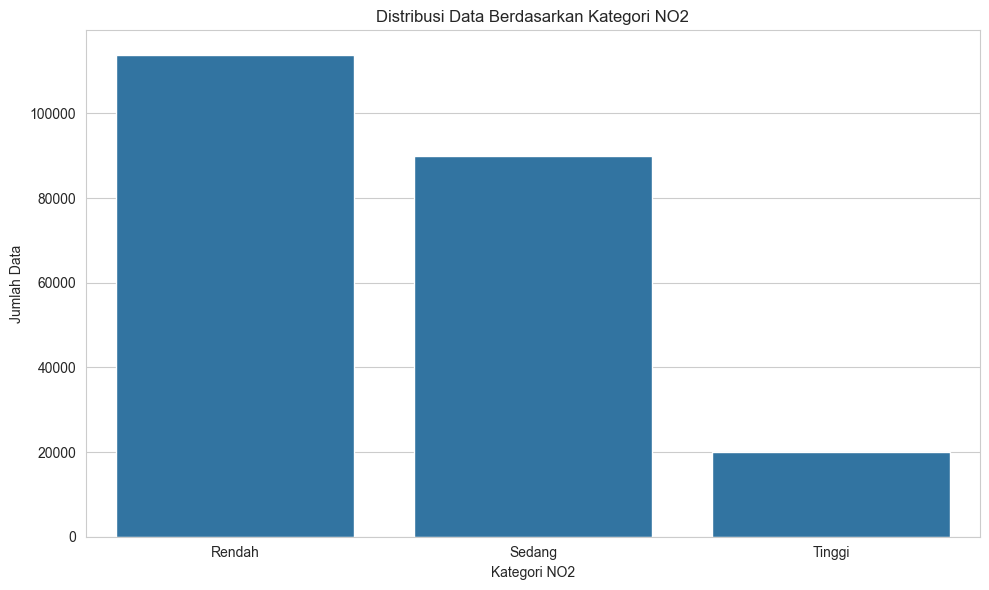

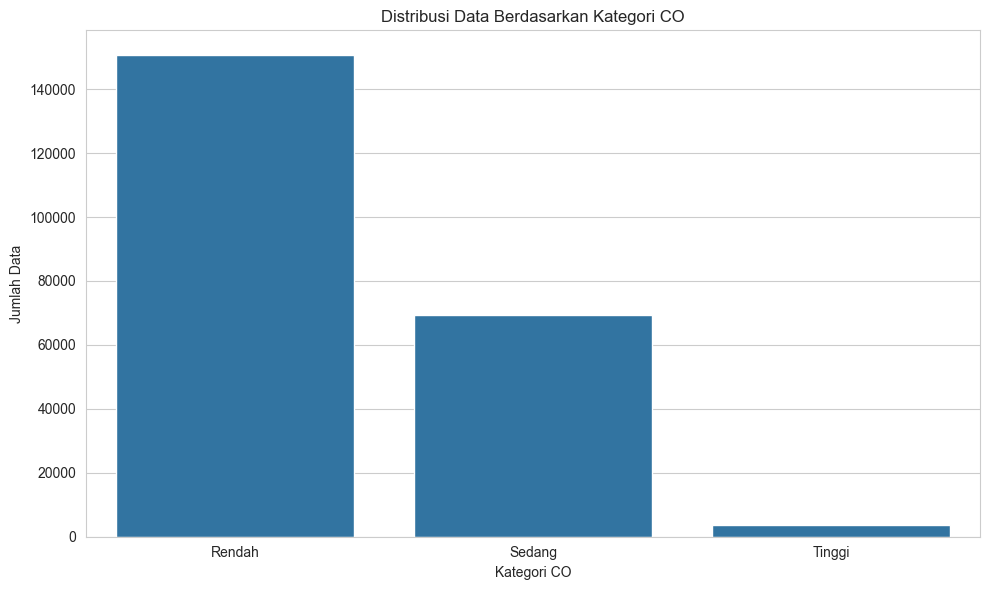

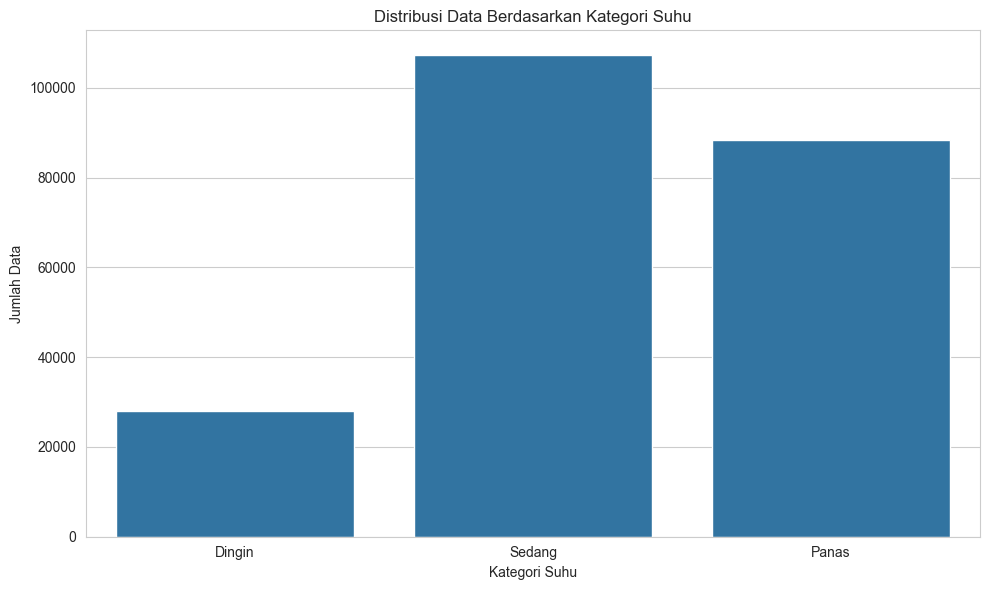

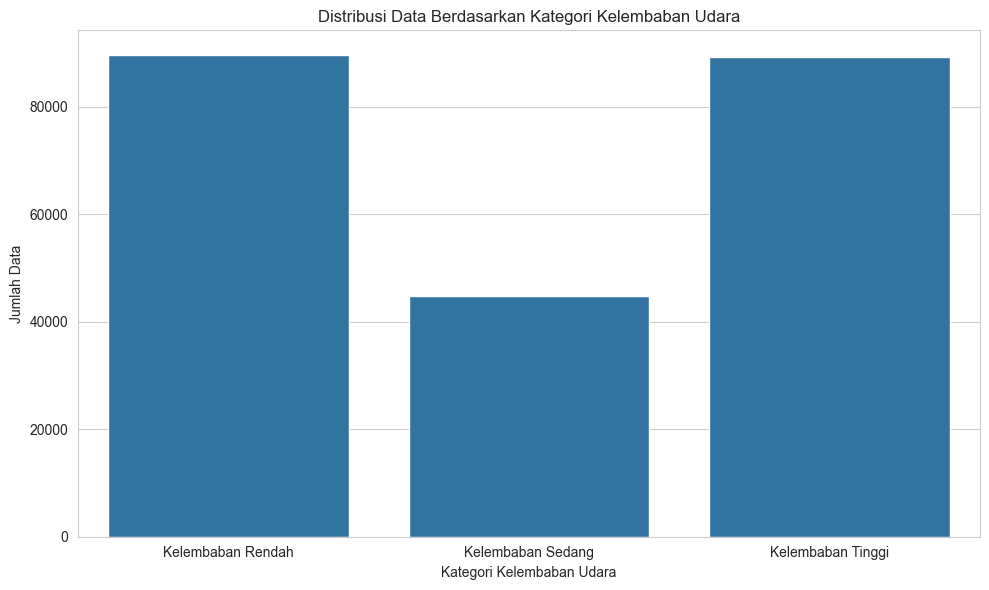

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Buat binning untuk NO2
def classify_no2(no2_value):
    if no2_value < 40:
        return 'Rendah'
    elif no2_value <= 80:
        return 'Sedang'
    else:
        return 'Tinggi'

# Buat binning untuk CO
def classify_co(co_value):
    if co_value < 1000:
        return 'Rendah'
    elif co_value <= 2000:
        return 'Sedang'
    else:
        return 'Tinggi'

# Buat binning untuk Suhu (TEMP)
def classify_temp(temp_value):
    if temp_value < 0:
        return 'Dingin'
    elif temp_value <= 20:
        return 'Sedang'
    else:
        return 'Panas'

# Buat binning untuk Kelembaban (DEWP)
def classify_dewp(dewp_value):
    if dewp_value < 0:
        return 'Kelembaban Rendah'
    elif dewp_value <= 10:
        return 'Kelembaban Sedang'
    else:
        return 'Kelembaban Tinggi'

# Terapkan binning ke dataset
three_year_df['NO2_Category'] = three_year_df['NO2'].apply(classify_no2)
three_year_df['CO_Category'] = three_year_df['CO'].apply(classify_co)
three_year_df['TEMP_Category'] = three_year_df['TEMP'].apply(classify_temp)
three_year_df['DEWP_Category'] = three_year_df['DEWP'].apply(classify_dewp)

# Lihat distribusi NO2, CO, TEMP, dan DEWP setelah binning
print(three_year_df['NO2_Category'].value_counts())
print(three_year_df['CO_Category'].value_counts())
print(three_year_df['TEMP_Category'].value_counts())
print(three_year_df['DEWP_Category'].value_counts())

# Visualisasi hasil binning
plt.figure(figsize=(10,6))
sns.countplot(data=three_year_df, x='NO2_Category', order=['Rendah', 'Sedang', 'Tinggi'])
plt.title('Distribusi Data Berdasarkan Kategori NO2')
plt.xlabel('Kategori NO2')
plt.ylabel('Jumlah Data')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,6))
sns.countplot(data=three_year_df, x='CO_Category', order=['Rendah', 'Sedang', 'Tinggi'])
plt.title('Distribusi Data Berdasarkan Kategori CO')
plt.xlabel('Kategori CO')
plt.ylabel('Jumlah Data')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,6))
sns.countplot(data=three_year_df, x='TEMP_Category', order=['Dingin', 'Sedang', 'Panas'])
plt.title('Distribusi Data Berdasarkan Kategori Suhu')
plt.xlabel('Kategori Suhu')
plt.ylabel('Jumlah Data')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,6))
sns.countplot(data=three_year_df, x='DEWP_Category', order=['Kelembaban Rendah', 'Kelembaban Sedang', 'Kelembaban Tinggi'])
plt.title('Distribusi Data Berdasarkan Kategori Kelembaban Udara')
plt.xlabel('Kategori Kelembaban Udara')
plt.ylabel('Jumlah Data')
plt.tight_layout()
plt.show()

**Insight:**
- Sebagian besar data menunjukkan bahwa konsentrasi NO2 berada di kategori rendah (<40 µg/m³), yang berarti mayoritas waktu, kualitas udara terkait NO2 berada pada level yang relatif aman. Namun, ada sekitar 20,069 data dengan konsentrasi NO2 yang tinggi (>80 µg/m³), yang mungkin mengindikasikan periode atau lokasi tertentu yang rentan terhadap peningkatan polusi NO2.
- Konsentrasi CO sebagian besar berada dalam kategori rendah (<1000 µg/m³), dengan hanya 3,625 data yang menunjukkan tingkat CO yang tinggi (>2000 µg/m³). Ini menunjukkan bahwa polusi CO jarang mencapai level yang membahayakan, dan kebanyakan waktu kualitas udara terkait CO cukup baik.
- Sebagian besar data menunjukkan kondisi suhu yang sedang (0-20°C), tetapi jumlah data untuk suhu panas (>20°C) juga signifikan. Ini menunjukkan bahwa data banyak diambil dari kondisi suhu yang cukup bervariasi, dan hampir sepertiga dari data menunjukkan suhu yang relatif panas, yang dapat berkontribusi terhadap peningkatan polusi seperti PM10. Suhu dingin (<0°C) relatif lebih jarang terjadi dalam dataset.
- Kelembaban udara menunjukkan distribusi yang cukup seimbang antara kelembaban rendah dan kelembaban tinggi, dengan lebih sedikit data untuk kelembaban sedang (0-10°C). Ini menunjukkan bahwa kondisi kelembaban udara cenderung berada di salah satu ekstrem (rendah atau tinggi), yang dapat berpengaruh pada konsentrasi polutan seperti SO2 yang cenderung berkurang pada kelembaban tinggi.

## Conclusion

- Peningkatan kecepatan angin memang memiliki sedikit efek dalam mengurangi konsentrasi PM2.5, tetapi pengaruhnya sangat terbatas. Ada faktor lain yang mungkin lebih dominan dalam penyebaran polutan PM2.5.
- Baik NO2 maupun CO memiliki pengaruh signifikan terhadap kualitas udara, dengan CO yang memiliki dampak sedikit lebih kuat. Keduanya berkorelasi positif dengan AQI, sehingga peningkatan konsentrasi kedua polutan ini akan berdampak negatif pada kualitas udara.
- Suhu dan kelembaban memiliki pengaruh terhadap konsentrasi polutan. Suhu yang lebih tinggi cenderung meningkatkan konsentrasi PM10, sementara kelembaban yang lebih tinggi cenderung menurunkan konsentrasi SO2.